# Downloading and Importing Libraries

In [ ]:
# Installing required libraries
!pip install torch torchvision matplotlib seaborn numpy requests Pillow

# Imports
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import Flowers102
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import numpy as np
from PIL import Image
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

# Check GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
print(f"PyTorch version: {torch.__version__}")
print(f"Torchvision version: {torchvision.__version__}")

Using device: cuda
PyTorch version: 2.10.0+cu128
Torchvision version: 0.25.0+cu128


# Working with Dataset

In [ ]:
# Downloading Oxford-102 Flowers dataset

# Transforming data points to ensure consistency
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

# Download all 3 splits
print("Downloading dataset...")
print("Downloading Completed")

train_data = Flowers102(root='./data', split='train', transform=transform, download=True)
val_data   = Flowers102(root='./data', split='val',   transform=transform, download=True)
test_data  = Flowers102(root='./data', split='test',  transform=transform, download=True)

print("Dataset splitted into train_data, val_data and test_data")

100%|██████████| 345M/345M [00:09<00:00, 34.9MB/s]
100%|██████████| 502/502 [00:00<00:00, 1.84MB/s]
100%|██████████| 15.0k/15.0k [00:00<00:00, 10.6MB/s]


Dataset splitted into train_data, val_data and test_data


In [ ]:
# Basic stats
print("\n--- Dataset Splits ---")
print(f"Train samples : {len(train_data)}")
print(f"Val samples   : {len(val_data)}")
print(f"Test samples  : {len(test_data)}")
print(f"Total samples : {len(train_data) + len(val_data) + len(test_data)}")
print(f"Total classes : 102 flower categories")
print(f"Image size    : 128 x 128 (resized)")
print(f"Tensor shape  : {train_data[0][0].shape}  (Color Channel x Height x Width)")


--- Dataset Splits ---
Train samples : 1020
Val samples   : 1020
Test samples  : 6149
Total samples : 8189
Total classes : 102 flower categories
Image size    : 128 x 128 (resized)
Tensor shape  : torch.Size([3, 128, 128])  (Color Channel x Height x Width)


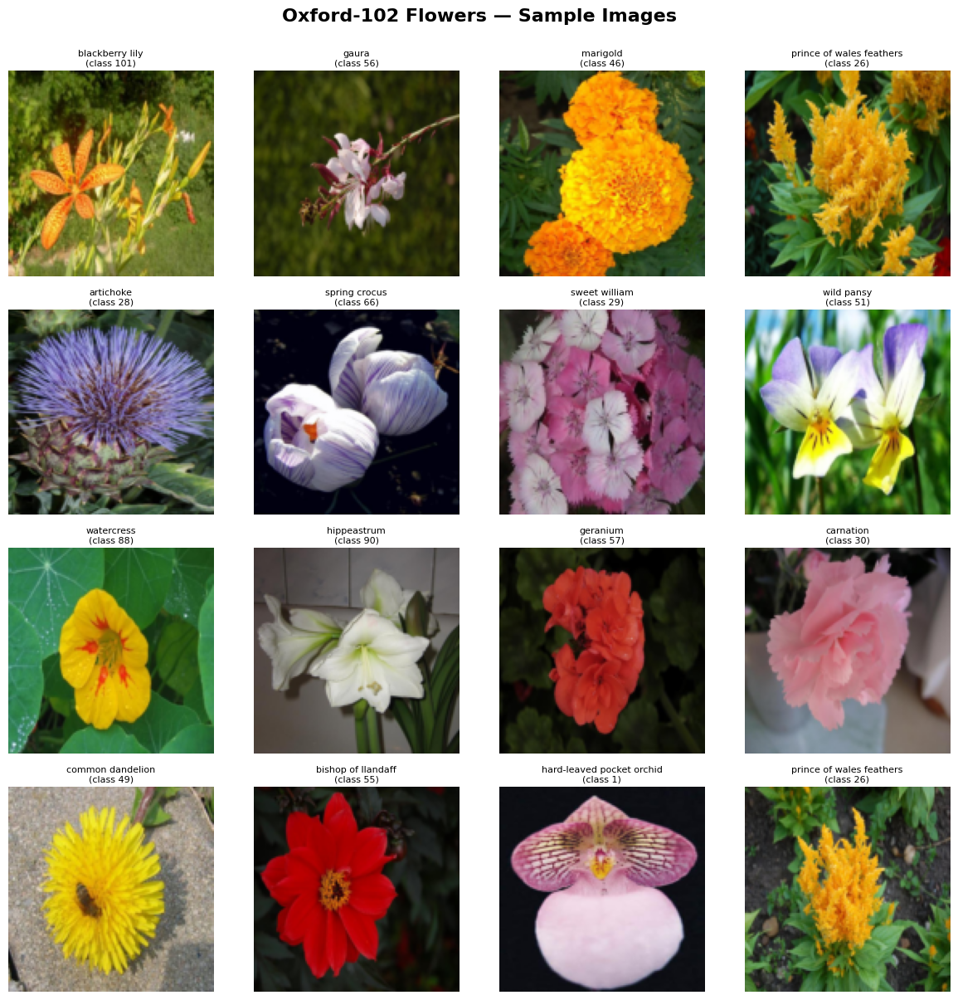

Saved as sample_images.png


In [ ]:
# Visualizing sample images from the dataset

# Flower class names (102 categories), needed to add manually as the original dataset only has numeric values for each flower(0-101)
flower_names = [
    "pink primrose", "hard-leaved pocket orchid", "canterbury bells", "sweet pea",
    "english marigold", "tiger lily", "moon orchid", "bird of paradise", "monkshood",
    "globe thistle", "snapdragon", "colt's foot", "king protea", "spear thistle",
    "yellow iris", "globe flower", "purple coneflower", "peruvian lily", "balloon flower",
    "giant white arum lily", "fire lily", "pincushion flower", "fritillary", "red ginger",
    "grape hyacinth", "corn poppy", "prince of wales feathers", "stemless gentian",
    "artichoke", "sweet william", "carnation", "garden phlox", "love in the mist",
    "mexican aster", "alpine sea holly", "ruby-lipped cattleya", "cape flower",
    "great masterwort", "siam tulip", "lenten rose", "barbeton daisy", "daffodil",
    "sword lily", "poinsettia", "bolero deep blue", "wallflower", "marigold",
    "buttercup", "oxeye daisy", "common dandelion", "petunia", "wild pansy",
    "primula", "sunflower", "pelargonium", "bishop of llandaff", "gaura", "geranium",
    "orange dahlia", "pink and yellow dahlia", "cautleya spicata", "japanese anemone",
    "black-eyed susan", "silverbush", "californian poppy", "osteospermum", "spring crocus",
    "bearded iris", "windflower", "tree poppy", "gazania", "azalea", "water lily",
    "rose", "thorn apple", "morning glory", "passion flower", "lotus", "toad lily",
    "anthurium", "frangipani", "clematis", "hibiscus", "columbine", "desert rose",
    "tree mallow", "magnolia", "cyclamen", "watercress", "canna lily", "hippeastrum",
    "bee balm", "ball moss", "foxglove", "bougainvillea", "camellia", "mallow",
    "mexican petunia", "bromeliad", "blanket flower", "trumpet creeper", "blackberry lily"
]

# Plots 16 random sample images
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
fig.suptitle('Oxford-102 Flowers — Sample Images', fontsize=16, fontweight='bold', y=1)

for i, ax in enumerate(axes.flat):
    idx = np.random.randint(0, len(train_data))
    image, label = train_data[idx]

    # Convert tensor back to displayable image
    image = image.permute(1, 2, 0).numpy()
    image = np.clip(image, 0, 1)

    ax.imshow(image)
    ax.set_title(f"{flower_names[label]}\n(class {label})", fontsize=8, pad=4)
    ax.axis('off')

plt.tight_layout()
plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved as sample_images.png")

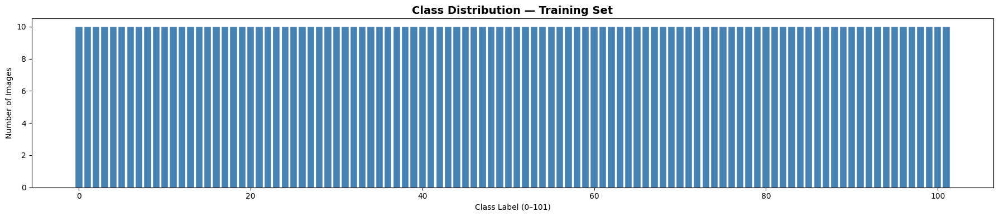

Min images per class : 10
Max images per class : 10
Avg images per class : 10.0


In [ ]:
# Dataset statistics and analysis

#1. Class distribution in training set
labels = [train_data[i][1] for i in range(len(train_data))]
label_counts = Counter(labels)

plt.figure(figsize=(18, 4))
plt.bar(label_counts.keys(), label_counts.values(), color='steelblue', edgecolor='white', linewidth=0.3)
plt.title('Class Distribution — Training Set', fontsize=14, fontweight='bold')
plt.xlabel('Class Label (0–101)')
plt.ylabel('Number of Images')
plt.tight_layout()
plt.savefig('class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()
print(f"Min images per class : {min(label_counts.values())}")
print(f"Max images per class : {max(label_counts.values())}")
print(f"Avg images per class : {np.mean(list(label_counts.values())):.1f}")

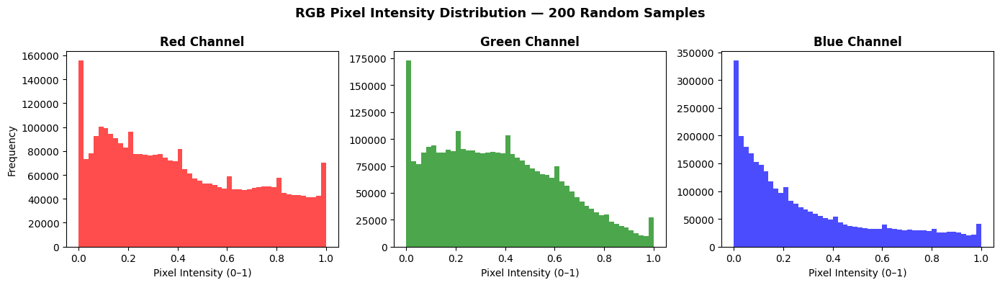

=== RGB Channel Statistics ===
Red   — Mean: 0.420  Std: 0.290
Green — Mean: 0.372  Std: 0.245
Blue  — Mean: 0.296  Std: 0.276


In [ ]:
#2. Pixel intensity distribution (RGB channels)
sample_size = 200  # analyze 200 random images
r_vals, g_vals, b_vals = [], [], []

for i in np.random.randint(0, len(train_data), sample_size):
    image, _ = train_data[i]
    r_vals.extend(image[0].numpy().flatten())
    g_vals.extend(image[1].numpy().flatten())
    b_vals.extend(image[2].numpy().flatten())

plt.figure(figsize=(14, 4))

# Red channel
plt.subplot(1, 3, 1)
plt.hist(r_vals, bins=50, color='red', alpha=0.7, edgecolor='none')
plt.title('Red Channel', fontweight='bold')
plt.xlabel('Pixel Intensity (0–1)')
plt.ylabel('Frequency')

# Green channel
plt.subplot(1, 3, 2)
plt.hist(g_vals, bins=50, color='green', alpha=0.7, edgecolor='none')
plt.title('Green Channel', fontweight='bold')
plt.xlabel('Pixel Intensity (0–1)')

# Blue channel
plt.subplot(1, 3, 3)
plt.hist(b_vals, bins=50, color='blue', alpha=0.7, edgecolor='none')
plt.title('Blue Channel', fontweight='bold')
plt.xlabel('Pixel Intensity (0–1)')

plt.suptitle('RGB Pixel Intensity Distribution — 200 Random Samples', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('rgb_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

#3. Print summary statistics
print("=== RGB Channel Statistics ===")
print(f"Red   — Mean: {np.mean(r_vals):.3f}  Std: {np.std(r_vals):.3f}")
print(f"Green — Mean: {np.mean(g_vals):.3f}  Std: {np.std(g_vals):.3f}")
print(f"Blue  — Mean: {np.mean(b_vals):.3f}  Std: {np.std(b_vals):.3f}")

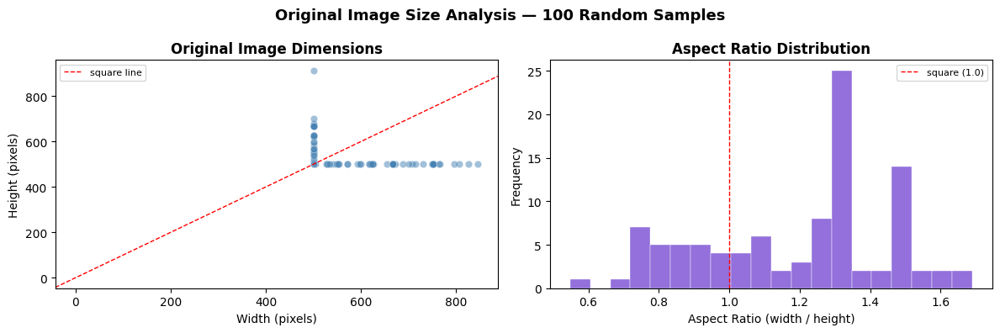

       DATASET SUMMARY — OXFORD 102 FLOWERS
  Total images        : 8,189
  Total classes       : 102
  Train / Val / Test  : 1020 / 1020 / 6149
  Images per class    : ~10 (balanced)
  Resized to          : 128 x 128 px
  Avg original width  : 620.6 px
  Avg original height : 531.0 px
  Avg aspect ratio    : 1.19
  Color channels      : 3 (RGB)
  Red mean            : 0.420
  Green mean          : 0.372
  Blue mean           : 0.296
  Task 3 Complete ✓


In [ ]:
#4. Original image size analysis (before resizing)
original_dataset = Flowers102(root='./data', split='train', download=False)

widths, heights = [], []
sample_size = 100

for i in np.random.randint(0, len(original_dataset), sample_size):
    img, _ = original_dataset[i]
    widths.append(img.width)
    heights.append(img.height)

# Plot width vs height scatter
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.scatter(widths, heights, alpha=0.5, color='steelblue', edgecolors='white', linewidth=0.3)
plt.title('Original Image Dimensions', fontweight='bold')
plt.xlabel('Width (pixels)')
plt.ylabel('Height (pixels)')
plt.axline((0, 0), slope=1, color='red', linestyle='--', linewidth=1, label='square line')
plt.legend(fontsize=8)

plt.subplot(1, 2, 2)
aspect_ratios = [w/h for w, h in zip(widths, heights)]
plt.hist(aspect_ratios, bins=20, color='mediumpurple', edgecolor='white', linewidth=0.3)
plt.title('Aspect Ratio Distribution', fontweight='bold')
plt.xlabel('Aspect Ratio (width / height)')
plt.ylabel('Frequency')
plt.axvline(x=1.0, color='red', linestyle='--', linewidth=1, label='square (1.0)')
plt.legend(fontsize=8)

plt.suptitle('Original Image Size Analysis — 100 Random Samples', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('image_sizes.png', dpi=150, bbox_inches='tight')
plt.show()

# --- 5. Final summary printout ---
print("=" * 45)
print("       DATASET SUMMARY — OXFORD 102 FLOWERS")
print("=" * 45)
print(f"  Total images        : 8,189")
print(f"  Total classes       : 102")
print(f"  Train / Val / Test  : 1020 / 1020 / 6149")
print(f"  Images per class    : ~10 (balanced)")
print(f"  Resized to          : 128 x 128 px")
print(f"  Avg original width  : {np.mean(widths):.1f} px")
print(f"  Avg original height : {np.mean(heights):.1f} px")
print(f"  Avg aspect ratio    : {np.mean(aspect_ratios):.2f}")
print(f"  Color channels      : 3 (RGB)")
print(f"  Red mean            : {np.mean(r_vals):.3f}")
print(f"  Green mean          : {np.mean(g_vals):.3f}")
print(f"  Blue mean           : {np.mean(b_vals):.3f}")
print("=" * 45)
print("  Task 3 Complete ✓")
print("=" * 45)

# Text Preprocessing & CLIP Embeddings

In [ ]:
# 1 Installing and loading CLIP

!pip install transformers torch Pillow --quiet

from transformers import CLIPTokenizer, CLIPTextModel, CLIPModel, CLIPProcessor
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import normalize
import warnings
warnings.filterwarnings('ignore')

# Load CLIP model and tokenizer
print("Loading CLIP model...")
model_name = "openai/clip-vit-base-patch32"

tokenizer  = CLIPTokenizer.from_pretrained(model_name)
text_model = CLIPTextModel.from_pretrained(model_name)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
text_model = text_model.to(device)
text_model.eval()

print(f"CLIP loaded successfully on {device} ✓")
print(f"Model      : {model_name}")
print(f"Vocab size : {tokenizer.vocab_size}")

Loading CLIP model...


tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                                            | Status     |  | 
---------------------------------------------------------------+------------+--+-
vision_model.encoder.layers.{0...11}.self_attn.v_proj.weight   | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.out_proj.bias   | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.q_proj.weight   | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.layer_norm1.weight        | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.v_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.k_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.q_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.mlp.fc1.bias              | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.layer_norm1.bias          | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.

CLIP loaded successfully on cuda ✓
Model      : openai/clip-vit-base-patch32
Vocab size : 49408


In [ ]:
#2 Tokenizing flower descriptions

# Creating descriptive captions for each flower class
def make_caption(flower_name):
    return f"a photo of a {flower_name} flower"

# Generating captions for all 102 flowers class
captions = [make_caption(name) for name in flower_names]

# Examples of created captions
print("Sample Captions")
for i in [0, 5, 10, 50, 74]:
    print(f"  Class {i:3d} : {captions[i]}")

# Tokenizing all the captions
print("\nTokenizing captions...")
tokens = tokenizer(
    captions,
    padding=True,
    truncation=True,
    max_length=77,
    return_tensors="pt"
)

print(f"\nTokenization Results")
print(f"Input IDs shape     : {tokens['input_ids'].shape}")
print(f"Attention mask shape: {tokens['attention_mask'].shape}")
print(f"Vocab size          : {tokenizer.vocab_size}")

# Inspect one tokenized caption in detail
print(f"\nInspecting Caption 0")
print(f"Caption   : {captions[0]}")
print(f"Token IDs : {tokens['input_ids'][0].tolist()}")
print(f"Tokens    : {tokenizer.convert_ids_to_tokens(tokens['input_ids'][0])}")

Sample Captions
  Class   0 : a photo of a pink primrose flower
  Class   5 : a photo of a tiger lily flower
  Class  10 : a photo of a snapdragon flower
  Class  50 : a photo of a petunia flower
  Class  74 : a photo of a thorn apple flower

Tokenizing captions...

Tokenization Results
Input IDs shape     : torch.Size([102, 13])
Attention mask shape: torch.Size([102, 13])
Vocab size          : 49408

Inspecting Caption 0
Caption   : a photo of a pink primrose flower
Token IDs : [49406, 320, 1125, 539, 320, 3360, 45891, 4055, 49407, 49407, 49407, 49407, 49407]
Tokens    : ['<|startoftext|>', 'a</w>', 'photo</w>', 'of</w>', 'a</w>', 'pink</w>', 'primrose</w>', 'flower</w>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>']


In [ ]:
#3 Generating CLIP embeddings

# Moving tokens to GPU
input_ids      = tokens['input_ids'].to(device)
attention_mask = tokens['attention_mask'].to(device)

# Generating embeddings, using torch.np_grad() to not track gradients
print("Generating embeddings...")
with torch.no_grad():
    outputs    = text_model(input_ids=input_ids, attention_mask=attention_mask)
    embeddings = outputs.pooler_output

# Normalizing embeddings
embeddings_np = embeddings.cpu().numpy()
embeddings_np = normalize(embeddings_np)

print(f"\n=== Embedding Results ===")
print(f"Raw embedding shape    : {embeddings.shape}")
print(f"Numpy array shape      : {embeddings_np.shape}")
print(f"Each flower is represented by {embeddings_np.shape[1]} numbers")

# Show a small slice of one embedding
print(f"\n=== Sample Embedding (Class 0 — pink primrose) ===")
print(f"First 10 values : {embeddings_np[0][:10].round(4)}")
print(f"Min value       : {embeddings_np[0].min():.4f}")
print(f"Max value       : {embeddings_np[0].max():.4f}")
print(f"Vector norm     : {np.linalg.norm(embeddings_np[0]):.4f}")

# Compute similarity between two flowers
def cosine_similarity(a, b):
    return np.dot(a, b)

print(f"\n=== Similarity Between Flowers ===")
pairs = [(0, 1), (0, 74), (74, 75), (0, 50)]
for i, j in pairs:
    sim = cosine_similarity(embeddings_np[i], embeddings_np[j])
    print(f"  {flower_names[i]:25s} vs {flower_names[j]:25s} → {sim:.4f}")

Generating embeddings...

=== Embedding Results ===
Raw embedding shape    : torch.Size([102, 512])
Numpy array shape      : (102, 512)
Each flower is represented by 512 numbers

=== Sample Embedding (Class 0 — pink primrose) ===
First 10 values : [ 0.0215  0.0113  0.0588  0.2149 -0.0024 -0.061  -0.0042  0.0483 -0.0304
 -0.019 ]
Min value       : -0.1517
Max value       : 0.2149
Vector norm     : 1.0000

=== Similarity Between Flowers ===
  pink primrose             vs hard-leaved pocket orchid → 0.5480
  pink primrose             vs thorn apple               → 0.5159
  thorn apple               vs morning glory             → 0.6398
  pink primrose             vs petunia                   → 0.6380


Running t-SNE...


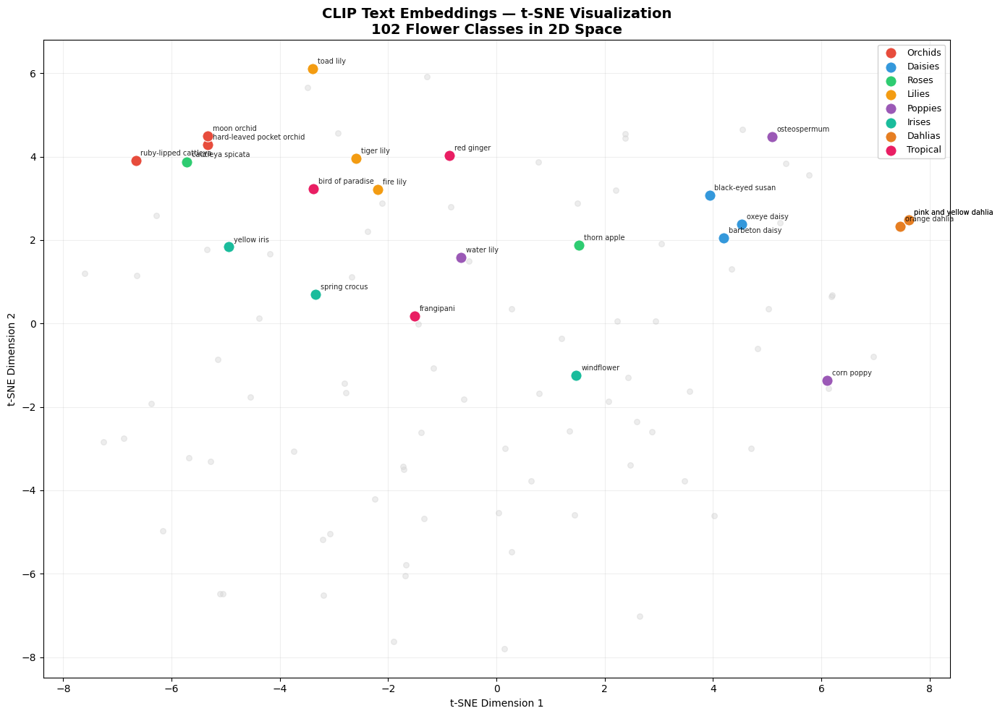

Saved as tsne_embeddings.png ✓


In [ ]:
#4 Visualizing embeddings with t-SNE

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Define flower categories (groups of related flowers)
categories = {
    'Orchids'    : [1, 6, 35],
    'Daisies'    : [40, 48, 62],
    'Roses'      : [74, 59, 60],
    'Lilies'     : [5, 20, 78],
    'Poppies'    : [25, 65, 72],
    'Irises'     : [14, 66, 68],
    'Dahlias'    : [58, 59],
    'Tropical'   : [7, 23, 80],
}

# Color map for categories
colors = ['#E74C3C', '#3498DB', '#2ECC71', '#F39C12',
          '#9B59B6', '#1ABC9C', '#E67E22', '#E91E63']

# Run t-SNE to reduce 512 dimensions → 2 dimensions
print("Running t-SNE...")
tsne = TSNE(
    n_components=2,
    perplexity=30,
    random_state=42,
    n_iter=1000
)
embeddings_2d = tsne.fit_transform(embeddings_np)

# Plot
fig, ax = plt.subplots(figsize=(14, 10))

# Plot all flowers as small gray dots first
ax.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1],
           color='lightgray', s=30, alpha=0.4, zorder=1)

# Highlight each category with color
for (category, indices), color in zip(categories.items(), colors):
    x = embeddings_2d[indices, 0]
    y = embeddings_2d[indices, 1]
    ax.scatter(x, y, color=color, s=120, label=category,
               zorder=2, edgecolors='white', linewidth=0.8)
    # Label each point
    for idx in indices:
        ax.annotate(
            flower_names[idx],
            (embeddings_2d[idx, 0], embeddings_2d[idx, 1]),
            fontsize=7, alpha=0.85,
            xytext=(5, 5), textcoords='offset points'
        )

ax.set_title('CLIP Text Embeddings — t-SNE Visualization\n102 Flower Classes in 2D Space',
             fontsize=14, fontweight='bold')
ax.legend(loc='upper right', fontsize=9, framealpha=0.9)
ax.set_xlabel('t-SNE Dimension 1')
ax.set_ylabel('t-SNE Dimension 2')
ax.grid(True, alpha=0.2)

plt.tight_layout()
plt.savefig('tsne_embeddings.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved as tsne_embeddings.png ✓")

# Conditional GAN (CGAN)

In [ ]:
#1 Install and setup

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import os
from torch.utils.data import Dataset, DataLoader

# Creating output directory to save generated images
os.makedirs('cgan_output', exist_ok=True)

# Hyperparameters
LATENT_DIM   = 100   # size of random noise vector
NUM_CLASSES  = 3     # circle, square, triangle
EMBED_DIM    = 50    # size of label embedding
IMG_SIZE     = 64    # image will be 64x64 pixels
CHANNELS     = 1     # grayscale (1 channel)
BATCH_SIZE   = 64    # images per training batch
EPOCHS       = 100   # number of training rounds
LR           = 0.0002  # learning rate
DEVICE       = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print("=== CGAN Setup ===")
print(f"Device      : {DEVICE}")
print(f"Latent dim  : {LATENT_DIM}")
print(f"Num classes : {NUM_CLASSES}  (circle, square, triangle)")
print(f"Image size  : {IMG_SIZE} x {IMG_SIZE}")
print(f"Batch size  : {BATCH_SIZE}")
print(f"Epochs      : {EPOCHS}")
print(f"Learning rate: {LR}")
print("\nSetup complete ✓")

=== CGAN Setup ===
Device      : cuda
Latent dim  : 100
Num classes : 3  (circle, square, triangle)
Image size  : 64 x 64
Batch size  : 64
Epochs      : 100
Learning rate: 0.0002

Setup complete ✓


Generating shapes dataset...
Dataset size    : 10000 images
Batches         : 157
Image shape     : torch.Size([10000, 1, 64, 64])
Labels shape    : torch.Size([10000])
Unique labels   : tensor([0, 1, 2])


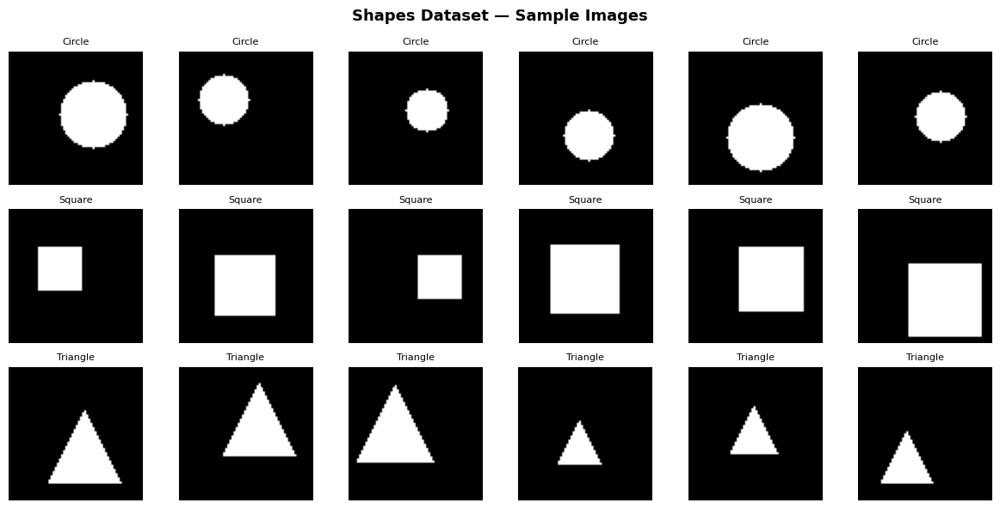

Saved shapes_samples.png ✓


In [ ]:
#2 Creating shapes dataset

import cv2

# Installing opencv
try:
    import cv2
except:
    !pip install opencv-python --quiet
    import cv2

class ShapesDataset(Dataset):
    def __init__(self, num_samples=10000):
        self.num_samples = num_samples
        self.images, self.labels = self._generate()

    def _generate(self):
        images = []
        labels = []

        shapes = ['circle', 'square', 'triangle']

        for i in range(self.num_samples):
            # Create blank white canvas
            img = np.zeros((64, 64), dtype=np.float32)

            # Pick a random shape
            label = np.random.randint(0, 3)

            # Random position and size
            cx = np.random.randint(20, 44)
            cy = np.random.randint(20, 44)
            size = np.random.randint(10, 20)

            if label == 0:  # Circle
                cv2.circle(img, (cx, cy), size, 1.0, -1)

            elif label == 1:  # Square
                x1, y1 = cx - size, cy - size
                x2, y2 = cx + size, cy + size
                cv2.rectangle(img, (x1, y1), (x2, y2), 1.0, -1)

            elif label == 2:  # Triangle
                pts = np.array([
                    [cx, cy - size],
                    [cx - size, cy + size],
                    [cx + size, cy + size]
                ], np.int32)
                cv2.fillPoly(img, [pts], 1.0)

            # Normalize to [-1, 1]
            img = (img - 0.5) / 0.5
            images.append(img)
            labels.append(label)

        images = np.array(images)[:, np.newaxis, :, :]
        return torch.FloatTensor(images), torch.LongTensor(labels)

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx]


# Create dataset and dataloader
print("Generating shapes dataset...")
dataset    = ShapesDataset(num_samples=10000)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

print(f"Dataset size    : {len(dataset)} images")
print(f"Batches         : {len(dataloader)}")
print(f"Image shape     : {dataset.images.shape}")
print(f"Labels shape    : {dataset.labels.shape}")
print(f"Unique labels   : {dataset.labels.unique()}")

# Visualize sample shapes
fig, axes = plt.subplots(3, 6, figsize=(12, 6))
shape_names = ['Circle', 'Square', 'Triangle']

for row, label in enumerate([0, 1, 2]):
    # Find 6 samples of this shape
    indices = (dataset.labels == label).nonzero().squeeze()[:6]
    for col, idx in enumerate(indices):
        img = dataset.images[idx].squeeze().numpy()
        axes[row, col].imshow(img, cmap='gray')
        axes[row, col].set_title(shape_names[label], fontsize=8)
        axes[row, col].axis('off')

plt.suptitle('Shapes Dataset — Sample Images', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('cgan_output/shapes_samples.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved shapes_samples.png ✓")

In [ ]:
#3 Building the Generator

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        # Label embedding layer
        self.label_emb = nn.Embedding(NUM_CLASSES, EMBED_DIM)

        # Main generator network
        self.model = nn.Sequential(

            # Layer 1: 150 → 256 × 4 × 4
            nn.Linear(LATENT_DIM + EMBED_DIM, 256 * 4 * 4),
            nn.BatchNorm1d(256 * 4 * 4),
            nn.ReLU(True),

            # Reshape happens outside Sequential

            # Layer 2: 4×4 → 8×8
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            # Layer 3: 8×8 → 16×16
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            # Layer 4: 16×16 → 32×32
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(True),

            # Layer 5: 32×32 → 64×64
            nn.ConvTranspose2d(32, CHANNELS, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, noise, labels):
        # Convert label to embedding
        label_embedding = self.label_emb(labels)

        # Combine noise and label embedding
        x = torch.cat([noise, label_embedding], dim=1)

        # Pass through first linear layer
        x = self.model[0](x)   # Linear
        x = self.model[1](x)   # BatchNorm1d
        x = self.model[2](x)   # ReLU

        # Reshape from flat to 3D feature map
        x = x.view(x.size(0), 256, 4, 4)

        # Pass through convolutional layers
        x = self.model[3:](x)

        return x


# Create generator and move to GPU
generator = Generator().to(DEVICE)

# Print summary
print("Generator Architecture: ")
print(generator)
total_params = sum(p.numel() for p in generator.parameters())
print(f"\nTotal parameters: {total_params:,}")

# Test with dummy input
noise      = torch.randn(4, LATENT_DIM).to(DEVICE)
labels     = torch.LongTensor([0, 1, 2, 0]).to(DEVICE)
test_output = generator(noise, labels)
print(f"\nTest input  — noise: {noise.shape}, labels: {labels.shape}")
print(f"Test output — image: {test_output.shape}")
print(f"Output range: [{test_output.min():.2f}, {test_output.max():.2f}]")
print("\nGenerator ready..")

Generator Architecture: 
Generator(
  (label_emb): Embedding(3, 50)
  (model): Sequential(
    (0): Linear(in_features=150, out_features=4096, bias=True)
    (1): BatchNorm1d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(32, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): Tanh()
  )
)

Total para

In [ ]:
#4 Building the Discriminator

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        # Label embedding layer
        self.label_emb = nn.Embedding(NUM_CLASSES, IMG_SIZE * IMG_SIZE)

        # Main discriminator network
        self.model = nn.Sequential(

            # Layer 1: 64×64 → 32×32
            nn.Conv2d(2, 32, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 2: 32×32 → 16×16
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 3: 16×16 → 8×8
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 4: 8×8 → 4×4
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            # Layer 5: flatten and classify
            nn.Flatten(),
            nn.Linear(256 * 4 * 4, 1),
            nn.Sigmoid()
        )

    def forward(self, image, labels):
        # Convert label to embedding and reshape to image size
        label_embedding = self.label_emb(labels)
        label_embedding = label_embedding.view(
            labels.size(0), 1, IMG_SIZE, IMG_SIZE
        )

        # Concatenate image and label along channel dimension
        x = torch.cat([image, label_embedding], dim=1)

        # Pass through network
        return self.model(x)


# Create discriminator and move to GPU
discriminator = Discriminator().to(DEVICE)

# Print summary
print("Discriminator Architecture: ")
print(discriminator)
total_params = sum(p.numel() for p in discriminator.parameters())
print(f"\nTotal parameters: {total_params:,}")

# Test with dummy input
test_images = torch.randn(4, 1, IMG_SIZE, IMG_SIZE).to(DEVICE)
test_labels = torch.LongTensor([0, 1, 2, 0]).to(DEVICE)
test_output  = discriminator(test_images, test_labels)
print(f"\nTest input  — image: {test_images.shape}, labels: {test_labels.shape}")
print(f"Test output — score: {test_output.shape}")
print(f"Sample scores: {test_output.detach().cpu().numpy().flatten().round(4)}")
print("\nDiscriminator ready...")

Discriminator Architecture: 
Discriminator(
  (label_emb): Embedding(3, 4096)
  (model): Sequential(
    (0): Conv2d(2, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Flatten(start_dim=1, end_dim=-1)
    (12): Linear(in_features=4096, out_features=1, bias=True)
    (13): 

Starting CGAN Training...
 Epoch     D Loss     G Loss     D(x)    D(G(z))
--------------------------------------------------
    10     0.1928     3.3027   0.9668     0.1190


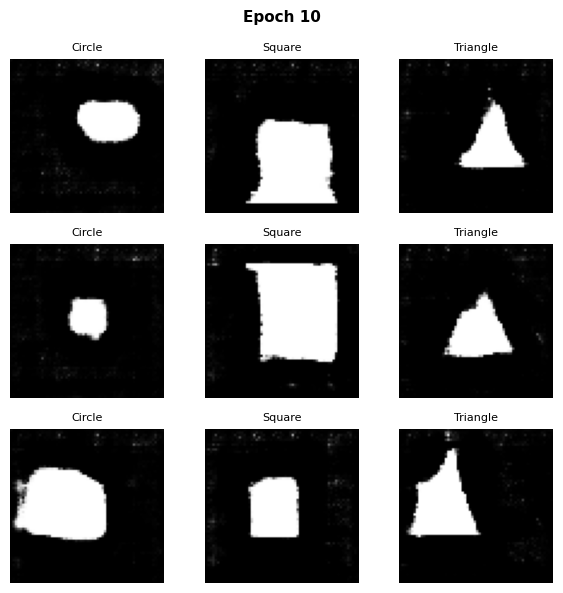

    20     0.1205     4.2554   0.9482     0.0916


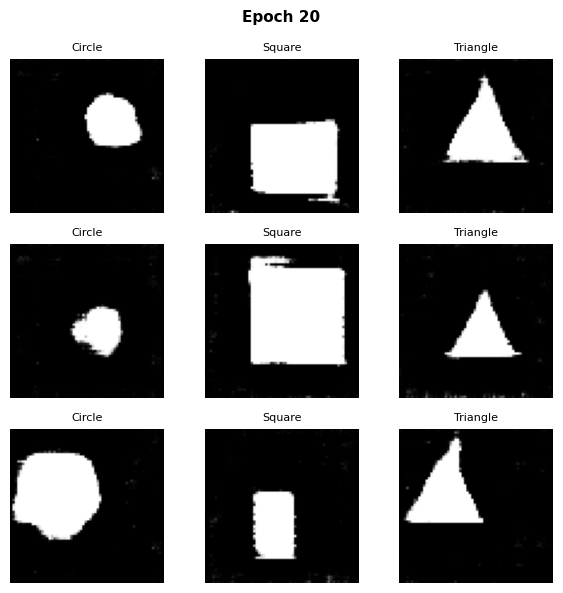

    30     0.0039     6.5179   0.9982     0.0030


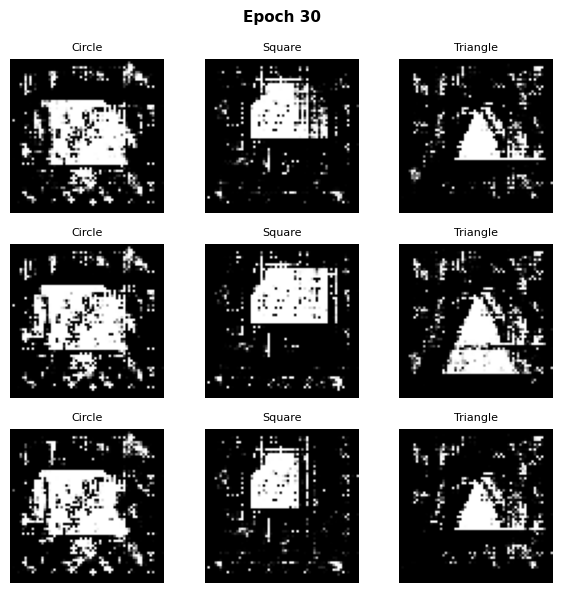

    40     0.0002     8.8148   0.9992     0.0001


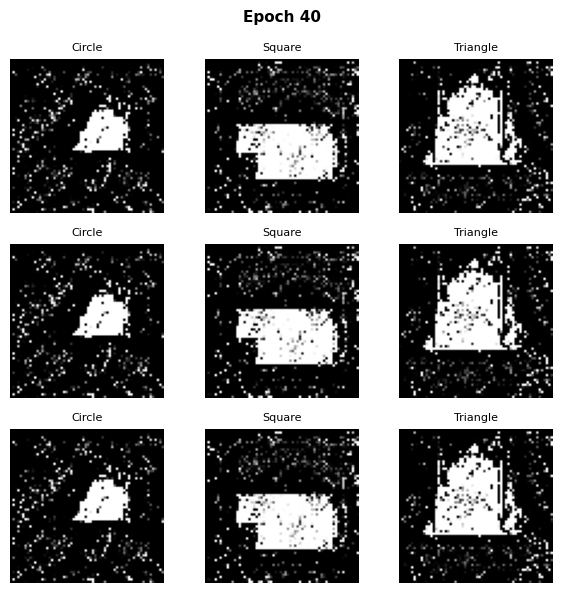

    50     0.0001     9.4103   0.9999     0.0001


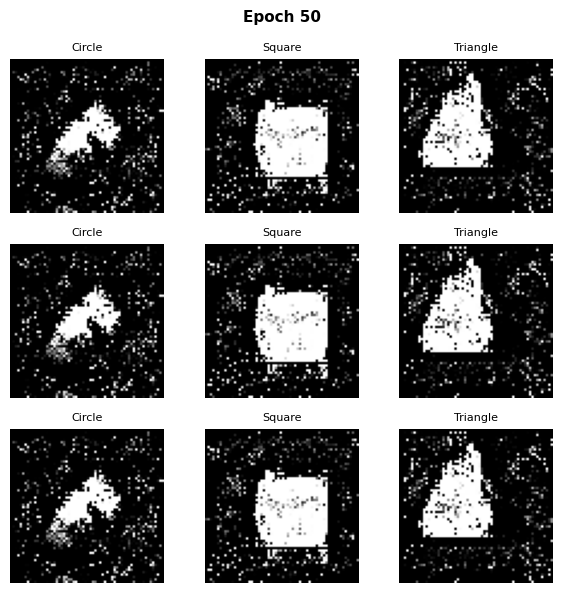

    60     0.0000    10.5797   1.0000     0.0001


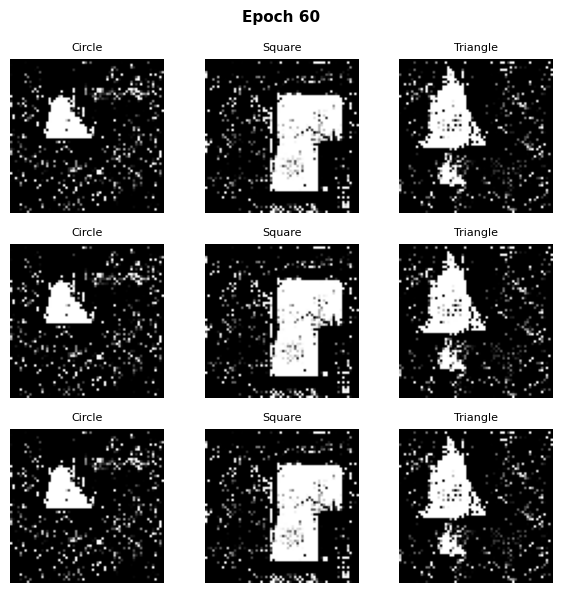

    70     0.0361     5.7604   0.9982     0.0016


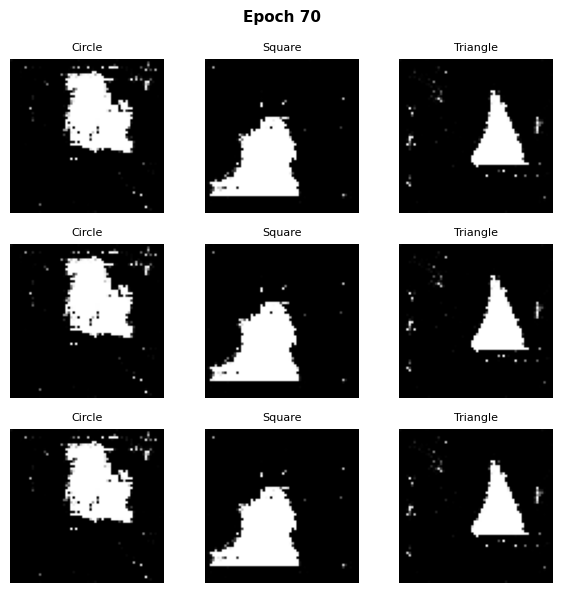

    80     0.0082     6.1648   0.9985     0.0002


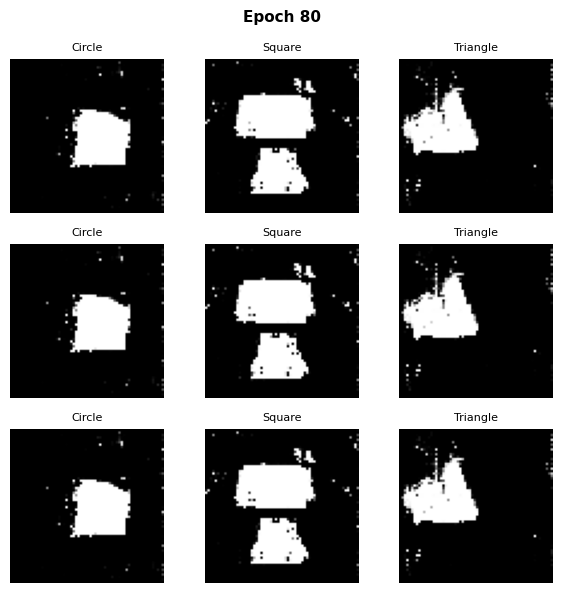

    90     0.0148     7.0660   0.9999     0.0010


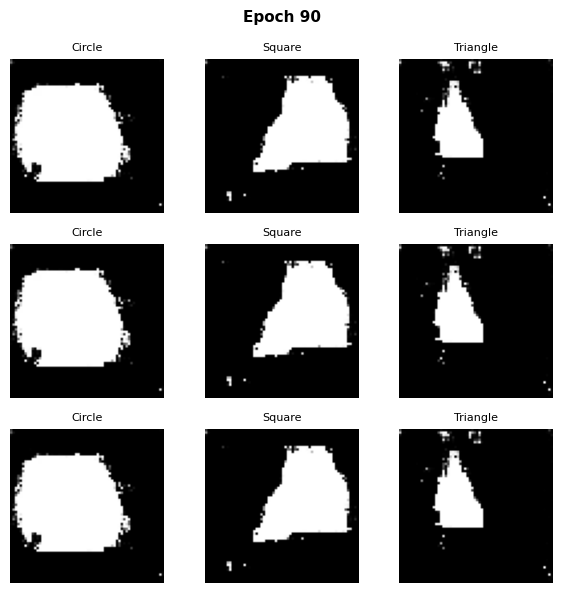

   100     0.0007     7.7472   0.9999     0.0008


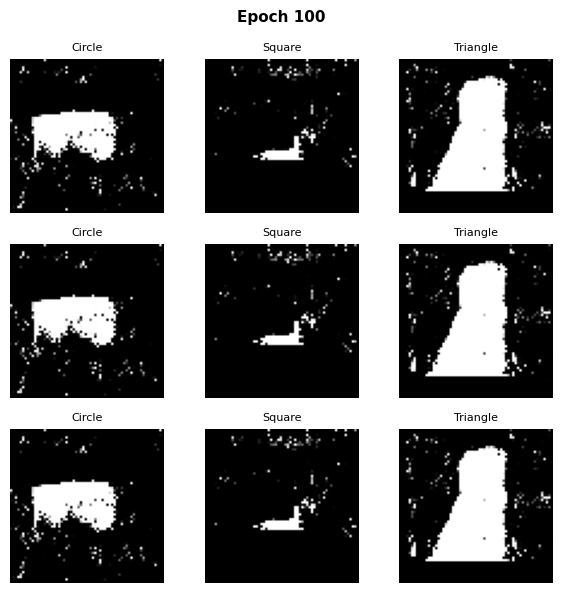


Training complete...


In [ ]:
#5 Train the CGAN

# Loss function and optimizers
criterion = nn.BCELoss()

optimizer_G = optim.Adam(generator.parameters(),     lr=LR, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=LR, betas=(0.5, 0.999))

# Fixed noise for visualization (same noise every epoch)
fixed_noise  = torch.randn(9, LATENT_DIM).to(DEVICE)
fixed_labels = torch.LongTensor([0,1,2, 0,1,2, 0,1,2]).to(DEVICE)

# Training history
G_losses, D_losses = [], []

print("Starting CGAN Training...")
print(f"{'Epoch':>6} {'D Loss':>10} {'G Loss':>10} {'D(x)':>8} {'D(G(z))':>10}")
print("-" * 50)

for epoch in range(EPOCHS):
    epoch_D_loss = 0
    epoch_G_loss = 0

    for real_images, real_labels in dataloader:

        batch_size = real_images.size(0)
        real_images = real_images.to(DEVICE)
        real_labels = real_labels.to(DEVICE)

        # Real and fake labels for loss
        real_targets = torch.ones(batch_size, 1).to(DEVICE)
        fake_targets = torch.zeros(batch_size, 1).to(DEVICE)

        # Training Discriminator
        optimizer_D.zero_grad()

        # Loss on real images
        real_preds = discriminator(real_images, real_labels)
        d_real_loss = criterion(real_preds, real_targets)

        # Generate fake images
        noise        = torch.randn(batch_size, LATENT_DIM).to(DEVICE)
        fake_labels  = torch.randint(0, NUM_CLASSES, (batch_size,)).to(DEVICE)
        fake_images  = generator(noise, fake_labels)

        # Loss on fake images
        fake_preds   = discriminator(fake_images.detach(), fake_labels)
        d_fake_loss  = criterion(fake_preds, fake_targets)

        # Total discriminator loss
        d_loss = (d_real_loss + d_fake_loss) / 2
        d_loss.backward()
        optimizer_D.step()

        # Training Generator
        optimizer_G.zero_grad()

        # Generator wants discriminator to think fakes are real
        fake_preds_for_G = discriminator(fake_images, fake_labels)
        g_loss = criterion(fake_preds_for_G, real_targets)

        g_loss.backward()
        optimizer_G.step()

        epoch_D_loss += d_loss.item()
        epoch_G_loss += g_loss.item()

    # Average losses for this epoch
    avg_D = epoch_D_loss / len(dataloader)
    avg_G = epoch_G_loss / len(dataloader)
    G_losses.append(avg_G)
    D_losses.append(avg_D)

    # Print every 10 epochs
    if (epoch + 1) % 10 == 0:
        d_x  = real_preds.mean().item()
        d_gz = fake_preds.mean().item()
        print(f"{epoch+1:>6} {avg_D:>10.4f} {avg_G:>10.4f} {d_x:>8.4f} {d_gz:>10.4f}")

        # Save sample generated images
        with torch.no_grad():
            sample_imgs = generator(fixed_noise, fixed_labels)
            sample_imgs = (sample_imgs + 1) / 2  # [-1,1] → [0,1]

        fig, axes = plt.subplots(3, 3, figsize=(6, 6))
        shape_names = ['Circle', 'Square', 'Triangle']
        for i, ax in enumerate(axes.flat):
            ax.imshow(sample_imgs[i].squeeze().cpu().numpy(), cmap='gray')
            ax.set_title(shape_names[fixed_labels[i].item()], fontsize=8)
            ax.axis('off')
        plt.suptitle(f'Epoch {epoch+1}', fontsize=11, fontweight='bold')
        plt.tight_layout()
        plt.savefig(f'cgan_output/epoch_{epoch+1:03d}.png', dpi=100, bbox_inches='tight')
        plt.show()

print("\nTraining complete...")

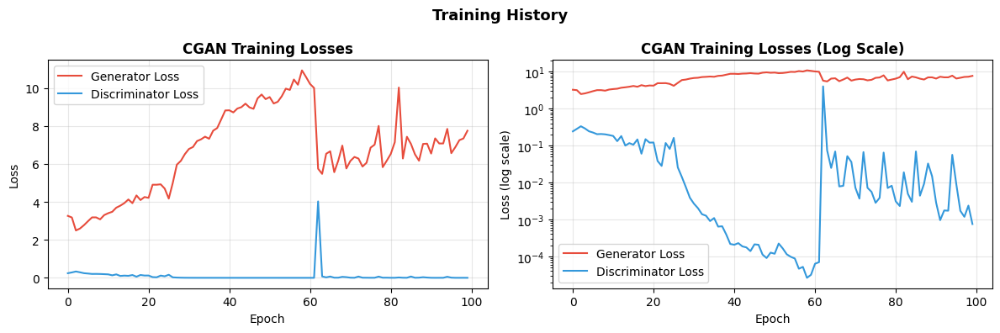

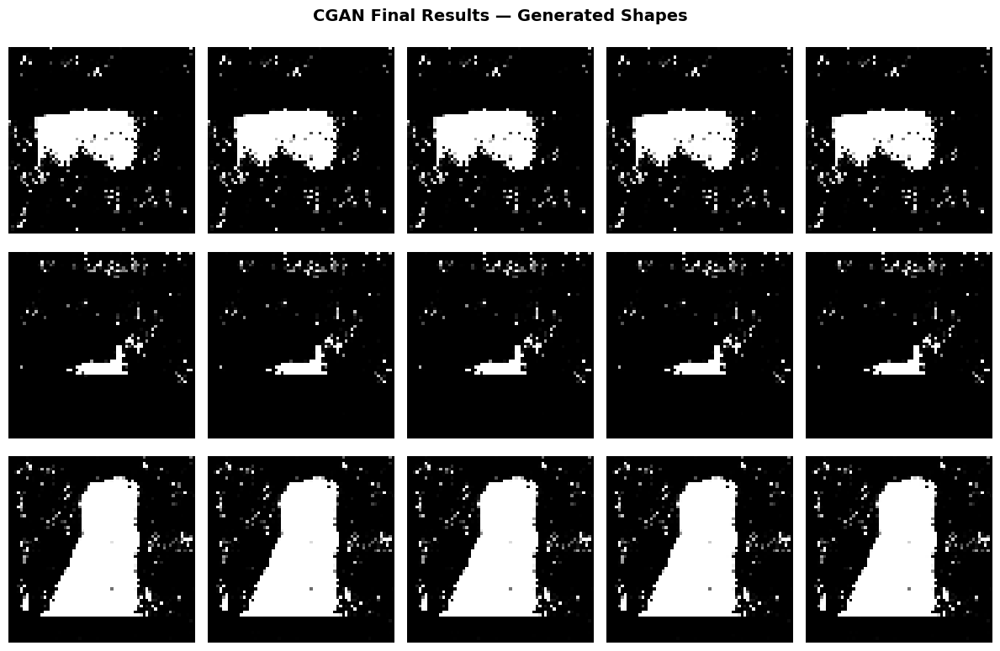

CGAN SUMMARY
  Model         : Conditional GAN
  Classes       : Circle, Square, Triangle
  Epochs trained: 100
  Image size    : 64 x 64
  Generator params    : 1,316,151
  Discriminator params: 706,913
  Final G Loss  : 7.7472
  Final D Loss  : 0.0007
  Saved outputs : cgan_output/
  Task 2 Complete...


In [ ]:
#6 Visualize results and loss curves

#1. Plot training loss curves
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(G_losses, label='Generator Loss',     color='#E74C3C', linewidth=1.5)
plt.plot(D_losses, label='Discriminator Loss', color='#3498DB', linewidth=1.5)
plt.title('CGAN Training Losses', fontweight='bold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(G_losses, label='Generator Loss',     color='#E74C3C', linewidth=1.5)
plt.plot(D_losses, label='Discriminator Loss', color='#3498DB', linewidth=1.5)
plt.title('CGAN Training Losses (Log Scale)', fontweight='bold')
plt.xlabel('Epoch')
plt.ylabel('Loss (log scale)')
plt.yscale('log')
plt.legend()
plt.grid(True, alpha=0.3)

plt.suptitle('Training History', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('cgan_output/loss_curves.png', dpi=150, bbox_inches='tight')
plt.show()

#2. Generate final showcase
generator.eval()

num_per_class = 5
shape_names   = ['Circle', 'Square', 'Triangle']
colors        = ['#E74C3C', '#3498DB', '#2ECC71']

fig, axes = plt.subplots(3, num_per_class, figsize=(12, 8))

with torch.no_grad():
    for row, shape_label in enumerate([0, 1, 2]):
        noise  = torch.randn(num_per_class, LATENT_DIM).to(DEVICE)
        labels = torch.LongTensor([shape_label] * num_per_class).to(DEVICE)
        imgs   = generator(noise, labels)
        imgs   = (imgs + 1) / 2  # [-1,1] → [0,1]

        for col in range(num_per_class):
            ax = axes[row, col]
            ax.imshow(imgs[col].squeeze().cpu().numpy(), cmap='gray')
            ax.axis('off')
            if col == 0:
                ax.set_ylabel(
                    shape_names[row],
                    fontsize=12,
                    fontweight='bold',
                    color=colors[row],
                    rotation=90,
                    labelpad=10
                )

plt.suptitle('CGAN Final Results — Generated Shapes',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('cgan_output/final_showcase.png', dpi=150, bbox_inches='tight')
plt.show()

#3. Print final summary
print("CGAN SUMMARY")
print(f"  Model         : Conditional GAN")
print(f"  Classes       : Circle, Square, Triangle")
print(f"  Epochs trained: {EPOCHS}")
print(f"  Image size    : {IMG_SIZE} x {IMG_SIZE}")
print(f"  Generator params    : {sum(p.numel() for p in generator.parameters()):,}")
print(f"  Discriminator params: {sum(p.numel() for p in discriminator.parameters()):,}")
print(f"  Final G Loss  : {G_losses[-1]:.4f}")
print(f"  Final D Loss  : {D_losses[-1]:.4f}")
print(f"  Saved outputs : cgan_output/")
print("  Task 2 Complete...")

# Attention GAN

In [ ]:
#1 Setup and Attention Module

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import os

os.makedirs('attention_gan_output', exist_ok=True)

# Hyperparameters
LATENT_DIM  = 100
NUM_CLASSES = 3
EMBED_DIM   = 50
IMG_SIZE    = 64
CHANNELS    = 1
BATCH_SIZE  = 64
EPOCHS      = 100
LR          = 0.0002
DEVICE      = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Self-Attention Module

class SelfAttention(nn.Module):
    def __init__(self, in_channels):
        super(SelfAttention, self).__init__()

        self.query = nn.Conv2d(in_channels, in_channels // 8, kernel_size=1)
        self.key   = nn.Conv2d(in_channels, in_channels // 8, kernel_size=1)
        self.value = nn.Conv2d(in_channels, in_channels,      kernel_size=1)

        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x):
        B, C, H, W = x.shape

        # Create query, key, value
        Q = self.query(x).view(B, -1, H * W).permute(0, 2, 1)
        K = self.key(x).view(B, -1, H * W)
        V = self.value(x).view(B, -1, H * W)

        # Attention map
        attention = self.softmax(torch.bmm(Q, K))

        # Apply attention to value
        out = torch.bmm(V, attention.permute(0, 2, 1))
        out = out.view(B, C, H, W)

        # Residual connection
        return self.gamma * out + x


# Cross-Attention Module

class CrossAttention(nn.Module):
    def __init__(self, in_channels, embed_dim):
        super(CrossAttention, self).__init__()

        self.in_channels = in_channels
        self.query = nn.Linear(embed_dim, in_channels // 8)
        self.key   = nn.Conv2d(in_channels, in_channels // 8, kernel_size=1)
        self.value = nn.Conv2d(in_channels, in_channels,      kernel_size=1)

        self.gamma   = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x, label_embed):
        B, C, H, W = x.shape

        # Query from label → [B, 1, C//8]
        Q = self.query(label_embed).unsqueeze(1)

        # Key from image → [B, C//8, H*W]
        K = self.key(x).view(B, -1, H * W)

        # Value from image → [B, C, H*W]
        V = self.value(x).view(B, -1, H * W)

        # Q: [B, 1, C//8]  x  K: [B, C//8, H*W] → [B, 1, H*W]
        attention = self.softmax(torch.bmm(Q, K))

        # V: [B, C, H*W]  x  attention.T: [B, H*W, 1] → [B, C, 1]
        out = torch.bmm(V, attention.permute(0, 2, 1))
        out = out.view(B, C, 1, 1).expand(B, C, H, W)

        return self.gamma * out + x


# Test both modules
print("Testing attention modules...")
test_feat  = torch.randn(4, 64, 16, 16)
test_embed = torch.randn(4, EMBED_DIM)

sa = SelfAttention(64)
ca = CrossAttention(64, EMBED_DIM)

sa_out = sa(test_feat)
ca_out = ca(test_feat, test_embed)

print(f"Self-Attention  input:  {test_feat.shape}")
print(f"Self-Attention  output: {sa_out.shape}")
print(f"Cross-Attention input:  {test_feat.shape}")
print(f"Cross-Attention output: {ca_out.shape}")
print(f"\nSelf-Attention  gamma: {sa.gamma.item():.4f}")
print(f"Cross-Attention gamma: {ca.gamma.item():.4f}")
print("\nAttention modules ready...")

Testing attention modules...
Self-Attention  input:  torch.Size([4, 64, 16, 16])
Self-Attention  output: torch.Size([4, 64, 16, 16])
Cross-Attention input:  torch.Size([4, 64, 16, 16])
Cross-Attention output: torch.Size([4, 64, 16, 16])

Self-Attention  gamma: 0.0000
Cross-Attention gamma: 0.0000

Attention modules ready...


In [ ]:
#2 Build Attention Generator

class AttentionGenerator(nn.Module):
    def __init__(self):
        super(AttentionGenerator, self).__init__()

        # Label embedding
        self.label_emb = nn.Embedding(NUM_CLASSES, EMBED_DIM)

        # Initial linear layer
        self.linear = nn.Sequential(
            nn.Linear(LATENT_DIM + EMBED_DIM, 256 * 4 * 4),
            nn.BatchNorm1d(256 * 4 * 4),
            nn.ReLU(True)
        )

        # Upsample blocks
        self.up1 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True)
        )

        self.up2 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True)
        )

        # Self-attention after up2 (at 16×16 resolution)
        self.self_attn = SelfAttention(64)

        self.up3 = nn.Sequential(
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(True)
        )

        # Cross-attention after up3 (at 32×32 resolution)
        self.cross_attn = CrossAttention(32, EMBED_DIM)

        self.up4 = nn.Sequential(
            nn.ConvTranspose2d(32, CHANNELS, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, noise, labels):
        # Get label embedding
        label_embed = self.label_emb(labels)

        # Combine noise and label
        x = torch.cat([noise, label_embed], dim=1)

        # Linear layer + reshape
        x = self.linear(x)
        x = x.view(x.size(0), 256, 4, 4)

        # Upsample with attention
        x = self.up1(x)                        # 4×4   → 8×8
        x = self.up2(x)                        # 8×8   → 16×16
        x = self.self_attn(x)                  # self-attention at 16×16
        x = self.up3(x)                        # 16×16 → 32×32
        x = self.cross_attn(x, label_embed)    # cross-attention at 32×32
        x = self.up4(x)                        # 32×32 → 64×64

        return x


# Create and test
attn_generator = AttentionGenerator().to(DEVICE)

# Test
noise      = torch.randn(4, LATENT_DIM).to(DEVICE)
labels     = torch.LongTensor([0, 1, 2, 0]).to(DEVICE)
test_out   = attn_generator(noise, labels)

print("Attention Generator")
print(attn_generator)
total = sum(p.numel() for p in attn_generator.parameters())
print(f"\nTotal parameters : {total:,}")
print(f"Test output shape: {test_out.shape}")
print(f"Output range     : [{test_out.min():.2f}, {test_out.max():.2f}]")
print("\nAttention Generator ready...")

Attention Generator
AttentionGenerator(
  (label_emb): Embedding(3, 50)
  (linear): Sequential(
    (0): Linear(in_features=150, out_features=4096, bias=True)
    (1): BatchNorm1d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (up1): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (up2): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (self_attn): SelfAttention(
    (query): Conv2d(64, 8, kernel_size=(1, 1), stride=(1, 1))
    (key): Conv2d(64, 8, kernel_size=(1, 1), stride=(1, 1))
    (value): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
    (softmax): Softmax(dim=-1)
  )
  (up3): Seq

In [ ]:
#3 Build Attention Discriminator

class AttentionDiscriminator(nn.Module):
    def __init__(self):
        super(AttentionDiscriminator, self).__init__()

        # Label embedding
        self.label_emb = nn.Embedding(NUM_CLASSES, IMG_SIZE * IMG_SIZE)

        # Downsample blocks
        self.down1 = nn.Sequential(
            nn.Conv2d(2, 32, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
        )

        self.down2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Self-attention at 16×16
        self.self_attn = SelfAttention(64)

        self.down3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Cross-attention at 8×8
        self.cross_attn = CrossAttention(128, EMBED_DIM)

        self.down4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Final classifier
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256 * 4 * 4, 1),
            nn.Sigmoid()
        )

    def forward(self, image, labels):
        # Embed label and reshape to image size
        label_embed     = self.label_emb(labels)
        label_map       = label_embed.view(labels.size(0), 1, IMG_SIZE, IMG_SIZE)

        # Concatenate image and label map
        x = torch.cat([image, label_map], dim=1)

        # Downsample with attention
        x = self.down1(x)                      # 64×64 → 32×32
        x = self.down2(x)                      # 32×32 → 16×16
        x = self.self_attn(x)                  # self-attention at 16×16
        x = self.down3(x)                      # 16×16 → 8×8

        # Cross-attention needs raw label embedding
        raw_embed = self.label_emb(labels)
        raw_embed = raw_embed[:, :EMBED_DIM]
        x = self.cross_attn(x, raw_embed)      # cross-attention at 8×8

        x = self.down4(x)                      # 8×8 → 4×4
        return self.classifier(x)


# Create and test
attn_discriminator = AttentionDiscriminator().to(DEVICE)

# Test
test_images = torch.randn(4, 1, IMG_SIZE, IMG_SIZE).to(DEVICE)
test_labels = torch.LongTensor([0, 1, 2, 0]).to(DEVICE)
test_out    = attn_discriminator(test_images, test_labels)

print("Attention Discriminator")
print(attn_discriminator)
total = sum(p.numel() for p in attn_discriminator.parameters())
print(f"\nTotal parameters : {total:,}")
print(f"Test output shape: {test_out.shape}")
print(f"Sample scores    : {test_out.detach().cpu().numpy().flatten().round(4)}")
print("\nAttention Discriminator ready...")

Attention Discriminator
AttentionDiscriminator(
  (label_emb): Embedding(3, 4096)
  (down1): Sequential(
    (0): Conv2d(2, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (down2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (self_attn): SelfAttention(
    (query): Conv2d(64, 8, kernel_size=(1, 1), stride=(1, 1))
    (key): Conv2d(64, 8, kernel_size=(1, 1), stride=(1, 1))
    (value): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
    (softmax): Softmax(dim=-1)
  )
  (down3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (cross_attn): CrossAtt

Starting Attention GAN Training...
 Epoch     D Loss     G Loss     D(x)    D(G(z))
--------------------------------------------------
    10     0.1693     6.0754   0.9112     0.0004


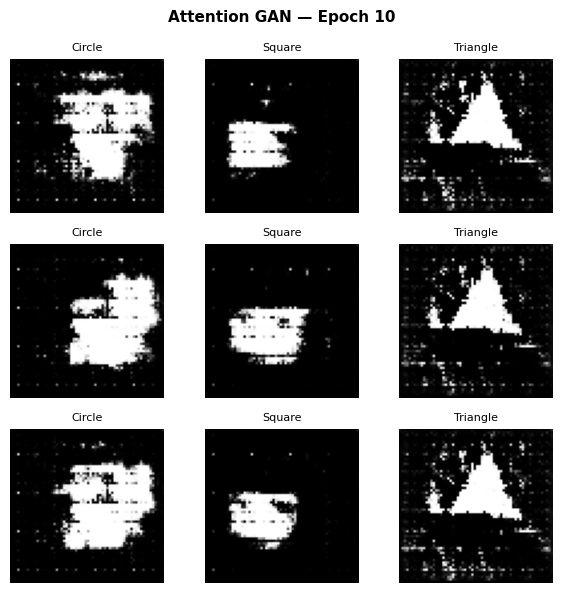

    20     0.1653     7.9584   0.9579     0.0010


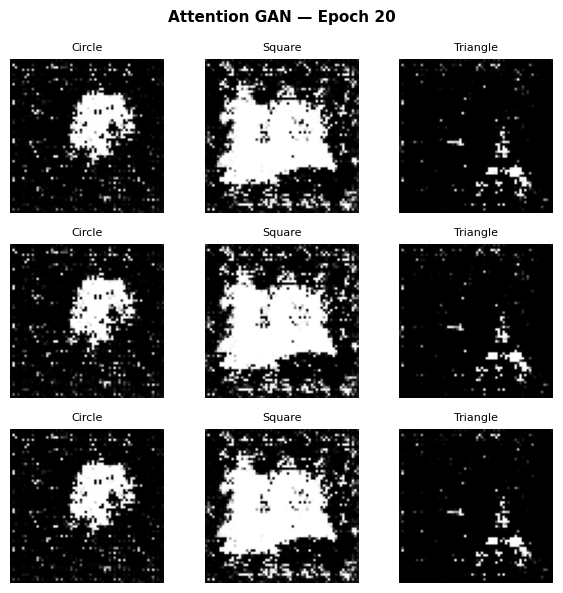

    30     0.1631     9.6028   0.8990     0.0000


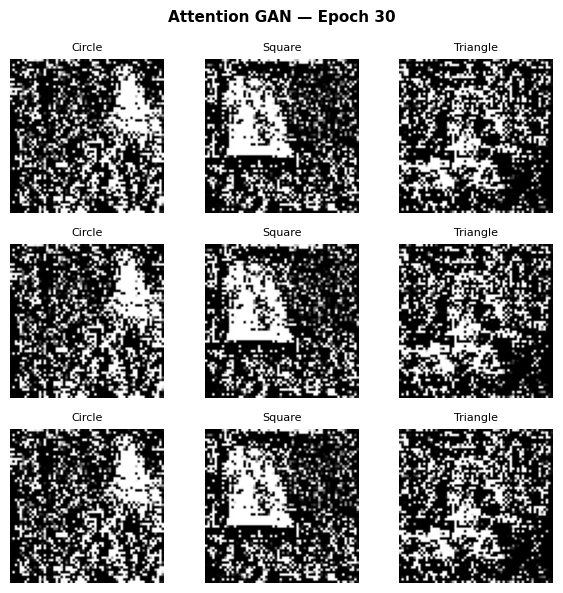

    40     0.1773     5.7850   0.8703     0.0005


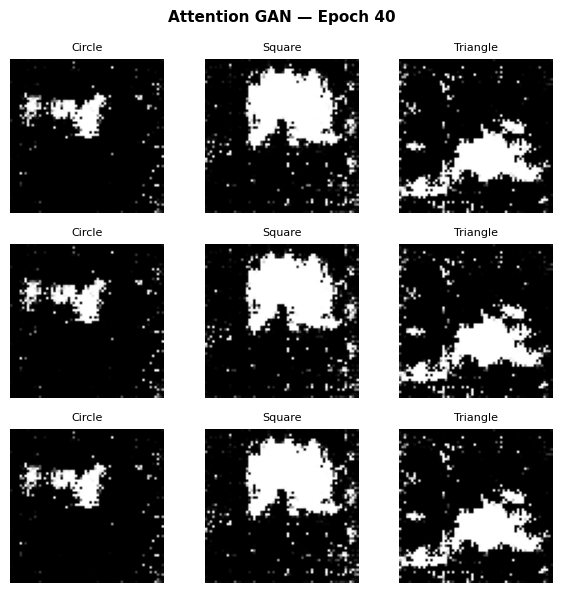

    50     0.1685     6.2982   0.9009     0.0016


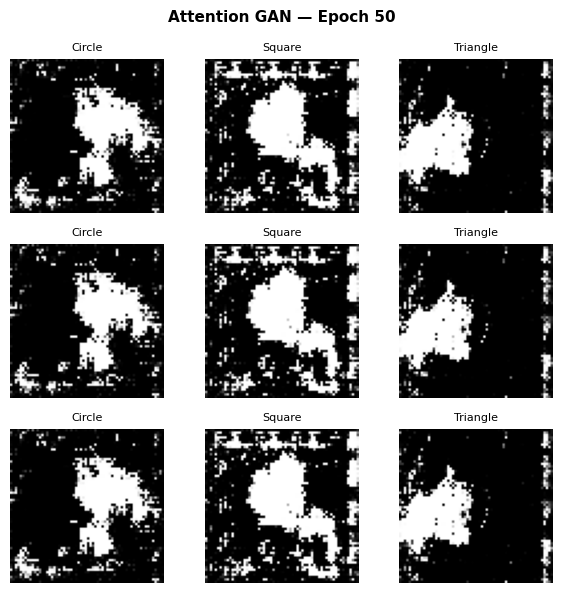

    60     0.1993     6.0410   0.8747     0.0041


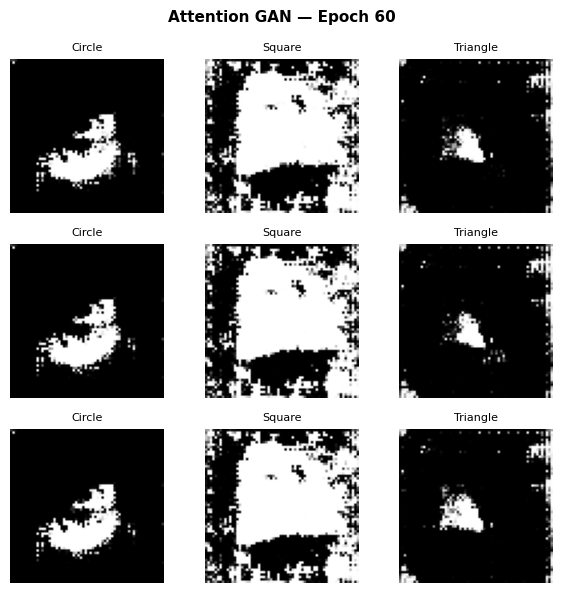

    70     0.1630     9.8711   0.9798     0.0166


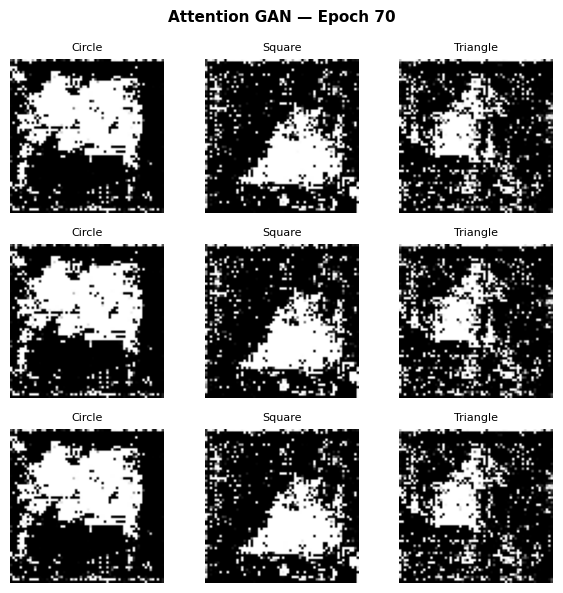

    80     0.1629    11.4702   0.8995     0.0000


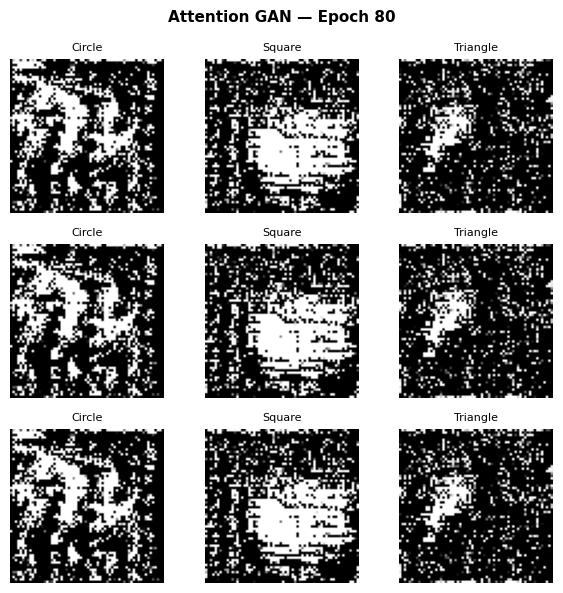

    90     0.1628     8.4900   0.9052     0.0001


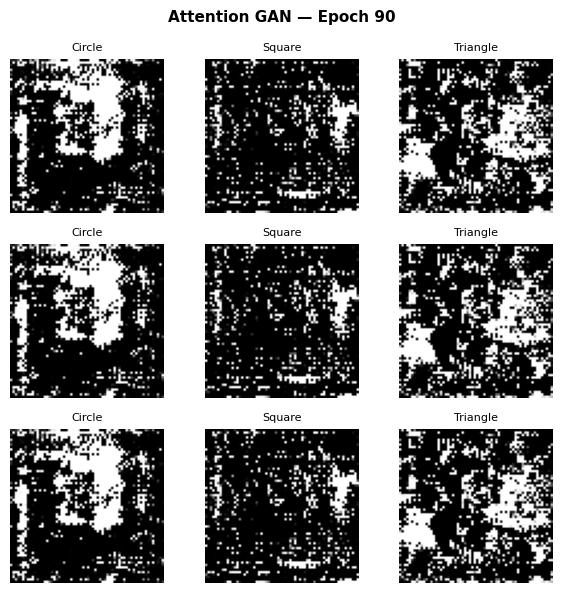

   100     0.1629    11.6603   0.8972     0.0000


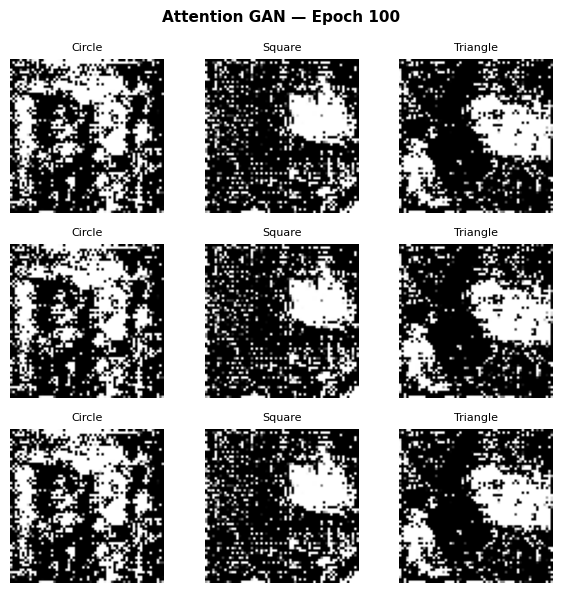


Attention GAN Training complete...


In [ ]:
#4 Train the Attention GAN

# Loss and optimizers
criterion    = nn.BCELoss()
optimizer_G  = optim.Adam(attn_generator.parameters(),     lr=LR, betas=(0.5, 0.999))
optimizer_D  = optim.Adam(attn_discriminator.parameters(), lr=LR, betas=(0.5, 0.999))

# Fixed noise for visualization
fixed_noise  = torch.randn(9, LATENT_DIM).to(DEVICE)
fixed_labels = torch.LongTensor([0,1,2, 0,1,2, 0,1,2]).to(DEVICE)

# Training history
G_losses_attn, D_losses_attn = [], []

print("Starting Attention GAN Training...")
print(f"{'Epoch':>6} {'D Loss':>10} {'G Loss':>10} {'D(x)':>8} {'D(G(z))':>10}")
print("-" * 50)

for epoch in range(EPOCHS):
    epoch_D_loss = 0
    epoch_G_loss = 0

    for real_images, real_labels in dataloader:

        batch_size  = real_images.size(0)
        real_images = real_images.to(DEVICE)
        real_labels = real_labels.to(DEVICE)

        # Smooth real targets slightly for stability
        real_targets = torch.ones(batch_size, 1).to(DEVICE) * 0.9
        fake_targets = torch.zeros(batch_size, 1).to(DEVICE)


        # Train Discriminator twice

        for _ in range(2):
            optimizer_D.zero_grad()

            # Real image loss
            real_preds  = attn_discriminator(real_images, real_labels)
            d_real_loss = criterion(real_preds, real_targets)

            # Generate fakes
            noise       = torch.randn(batch_size, LATENT_DIM).to(DEVICE)
            fake_labels = torch.randint(0, NUM_CLASSES, (batch_size,)).to(DEVICE)
            fake_images = attn_generator(noise, fake_labels)

            # Fake image loss
            fake_preds  = attn_discriminator(fake_images.detach(), fake_labels)
            d_fake_loss = criterion(fake_preds, fake_targets)

            # Total discriminator loss
            d_loss = (d_real_loss + d_fake_loss) / 2
            d_loss.backward()
            optimizer_D.step()


        # Train Generator once

        optimizer_G.zero_grad()

        fake_preds_G = attn_discriminator(fake_images, fake_labels)
        g_loss       = criterion(fake_preds_G, real_targets)

        g_loss.backward()
        optimizer_G.step()

        epoch_D_loss += d_loss.item()
        epoch_G_loss += g_loss.item()

    # Average losses
    avg_D = epoch_D_loss / len(dataloader)
    avg_G = epoch_G_loss / len(dataloader)
    G_losses_attn.append(avg_G)
    D_losses_attn.append(avg_D)

    # Print and visualize every 10 epochs
    if (epoch + 1) % 10 == 0:
        d_x  = real_preds.mean().item()
        d_gz = fake_preds.mean().item()
        print(f"{epoch+1:>6} {avg_D:>10.4f} {avg_G:>10.4f} {d_x:>8.4f} {d_gz:>10.4f}")

        with torch.no_grad():
            sample_imgs = attn_generator(fixed_noise, fixed_labels)
            sample_imgs = (sample_imgs + 1) / 2

        fig, axes = plt.subplots(3, 3, figsize=(6, 6))
        shape_names = ['Circle', 'Square', 'Triangle']
        for i, ax in enumerate(axes.flat):
            ax.imshow(sample_imgs[i].squeeze().cpu().numpy(), cmap='gray')
            ax.set_title(shape_names[fixed_labels[i].item()], fontsize=8)
            ax.axis('off')
        plt.suptitle(f'Attention GAN — Epoch {epoch+1}',
                     fontsize=11, fontweight='bold')
        plt.tight_layout()
        plt.savefig(f'attention_gan_output/epoch_{epoch+1:03d}.png',
                    dpi=100, bbox_inches='tight')
        plt.show()

print("\nAttention GAN Training complete...")

In [ ]:
# Quick diagnosis
print("Training Diagnosis")
print(f"Final D Loss    : {D_losses_attn[-1]:.4f}")
print(f"Final G Loss    : {G_losses_attn[-1]:.4f}")
print(f"Min D Loss      : {min(D_losses_attn):.4f}")
print(f"Max G Loss      : {max(G_losses_attn):.4f}")

if D_losses_attn[-1] < 0.2:
    print("\nDiagnosis: Generator dominance")
    print("Fix: Train discriminator more, reduce LR")
elif G_losses_attn[-1] < 0.2:
    print("\nDiagnosis: Discriminator dominance")
    print("Fix: Reduce discriminator capacity")
else:
    print("\nDiagnosis: Balanced training...")

Training Diagnosis
Final D Loss    : 0.1629
Final G Loss    : 11.6603
Min D Loss      : 0.1626
Max G Loss      : 11.9426

Diagnosis: Generator dominance
Fix: Train discriminator more, reduce LR


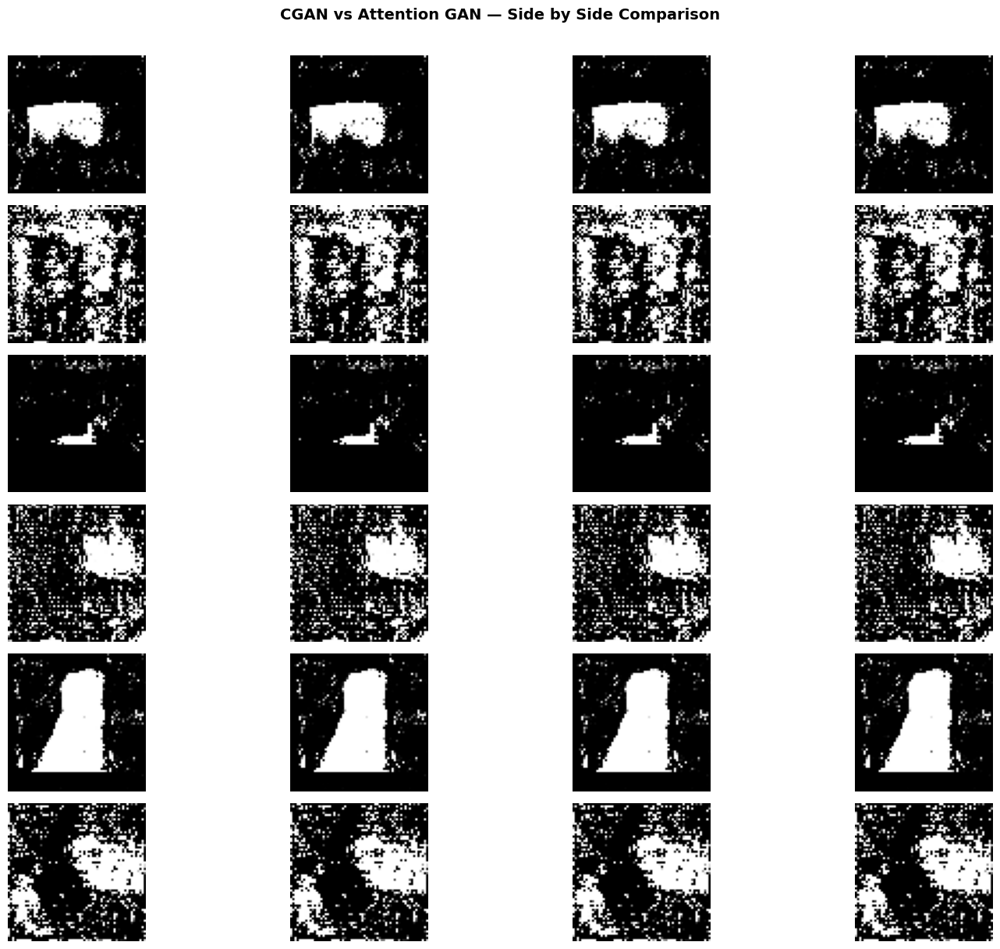

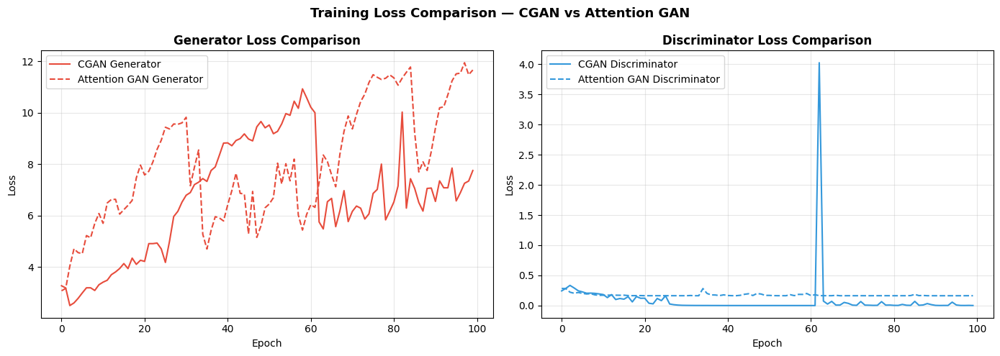

COMPARISON SUMMARY

  Metric                          CGAN  Attention
  ---------------------------------------------
  Final G Loss                  7.7472    11.6603
  Final D Loss                  0.0007     0.1629
  Min D Loss                    0.0000     0.1626
  Max G Loss                   10.9263    11.9426
  Generator Params           1,316,151  1,322,745
  Discriminator Params         706,913    731,507

  Saved to: attention_gan_output/


In [ ]:
#5 Compare CGAN vs Attention GAN results

fig = plt.figure(figsize=(16, 12))
shape_names = ['Circle', 'Square', 'Triangle']
colors      = ['#E74C3C', '#3498DB', '#2ECC71']

# Set both generators to eval mode
generator.eval()
attn_generator.eval()

with torch.no_grad():

    for row, shape_label in enumerate([0, 1, 2]):

        noise  = torch.randn(4, LATENT_DIM).to(DEVICE)
        labels = torch.LongTensor([shape_label] * 4).to(DEVICE)

        #CGAN outputs
        cgan_imgs = generator(noise, labels)
        cgan_imgs = (cgan_imgs + 1) / 2

        #Attention GAN outputs
        attn_imgs = attn_generator(noise, labels)
        attn_imgs = (attn_imgs + 1) / 2

        # Plot CGAN images
        for col in range(4):
            ax = fig.add_subplot(6, 4, row * 8 + col + 1)
            ax.imshow(cgan_imgs[col].squeeze().cpu().numpy(), cmap='gray')
            ax.axis('off')
            if col == 0:
                ax.set_ylabel(
                    f'CGAN\n{shape_names[row]}',
                    fontsize=9, fontweight='bold',
                    color=colors[row]
                )

        # Plot Attention GAN images
        for col in range(4):
            ax = fig.add_subplot(6, 4, row * 8 + col + 5)
            ax.imshow(attn_imgs[col].squeeze().cpu().numpy(), cmap='gray')
            ax.axis('off')
            if col == 0:
                ax.set_ylabel(
                    f'Attention\n{shape_names[row]}',
                    fontsize=9, fontweight='bold',
                    color=colors[row]
                )

plt.suptitle(
    'CGAN vs Attention GAN — Side by Side Comparison',
    fontsize=14, fontweight='bold', y=1.01
)
plt.tight_layout()
plt.savefig('attention_gan_output/comparison.png', dpi=150, bbox_inches='tight')
plt.show()

# Loss curve comparison
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(G_losses,      label='CGAN Generator',          color='#E74C3C', linewidth=1.5)
axes[0].plot(G_losses_attn, label='Attention GAN Generator', color='#E74C3C', linewidth=1.5, linestyle='--')
axes[0].set_title('Generator Loss Comparison', fontweight='bold')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(D_losses,      label='CGAN Discriminator',          color='#3498DB', linewidth=1.5)
axes[1].plot(D_losses_attn, label='Attention GAN Discriminator', color='#3498DB', linewidth=1.5, linestyle='--')
axes[1].set_title('Discriminator Loss Comparison', fontweight='bold')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.suptitle('Training Loss Comparison — CGAN vs Attention GAN',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('attention_gan_output/loss_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

#Final summary
print("=" * 50)
print("COMPARISON SUMMARY")
print("=" * 50)
print(f"\n  {'Metric':<25} {'CGAN':>10} {'Attention':>10}")
print(f"  {'-'*45}")
print(f"  {'Final G Loss':<25} {G_losses[-1]:>10.4f} {G_losses_attn[-1]:>10.4f}")
print(f"  {'Final D Loss':<25} {D_losses[-1]:>10.4f} {D_losses_attn[-1]:>10.4f}")
print(f"  {'Min D Loss':<25} {min(D_losses):>10.4f} {min(D_losses_attn):>10.4f}")
print(f"  {'Max G Loss':<25} {max(G_losses):>10.4f} {max(G_losses_attn):>10.4f}")
print(f"  {'Generator Params':<25} {sum(p.numel() for p in generator.parameters()):>10,} {sum(p.numel() for p in attn_generator.parameters()):>10,}")
print(f"  {'Discriminator Params':<25} {sum(p.numel() for p in discriminator.parameters()):>10,} {sum(p.numel() for p in attn_discriminator.parameters()):>10,}")
print(f"\n  Saved to: attention_gan_output/")

# Stable Diffusion

In [ ]:
#1 Install and setup for LoRA fine-tuning

!pip install diffusers transformers accelerate peft torch torchvision \
             xformers bitsandbytes Pillow matplotlib numpy --quiet

!pip install datasets huggingface_hub --quiet

# Imports
import torch
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path
from PIL import Image
from huggingface_hub import login

# Diffusers imports
from diffusers import (
    StableDiffusionPipeline,
    DDPMScheduler,
    AutoencoderKL,
    UNet2DConditionModel
)
from transformers import CLIPTextModel, CLIPTokenizer
from peft import LoraConfig, get_peft_model

# Create output directories
os.makedirs('sd_output',       exist_ok=True)
os.makedirs('sd_output/train', exist_ok=True)
os.makedirs('sd_output/generated', exist_ok=True)

# Check GPU
device     = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
gpu_memory = torch.cuda.get_device_properties(0).total_memory / 1e9 if torch.cuda.is_available() else 0

print("=== Stable Diffusion LoRA Setup ===")
print(f"Device      : {device}")
print(f"GPU Memory  : {gpu_memory:.1f} GB")
print(f"PyTorch     : {torch.__version__}")
print(f"CUDA        : {torch.version.cuda}")

if gpu_memory < 8:
    print("\n Warning: Less than 8GB GPU memory")
    print("   Reduce batch size to 1 if you get OOM errors")
else:
    print(f"\n GPU memory sufficient for LoRA training")

print("\nSetup complete...")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 34.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.7/60.7 MB 14.5 MB/s eta 0:00:00


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


=== Stable Diffusion LoRA Setup ===
Device      : cuda
GPU Memory  : 15.6 GB
PyTorch     : 2.10.0+cu128
CUDA        : 12.8

 GPU memory sufficient for LoRA training

Setup complete...


Loading flower dataset for Stable Diffusion...
Dataset size    : 1020 images
Image size      : 512 × 512
Batch size      : 1


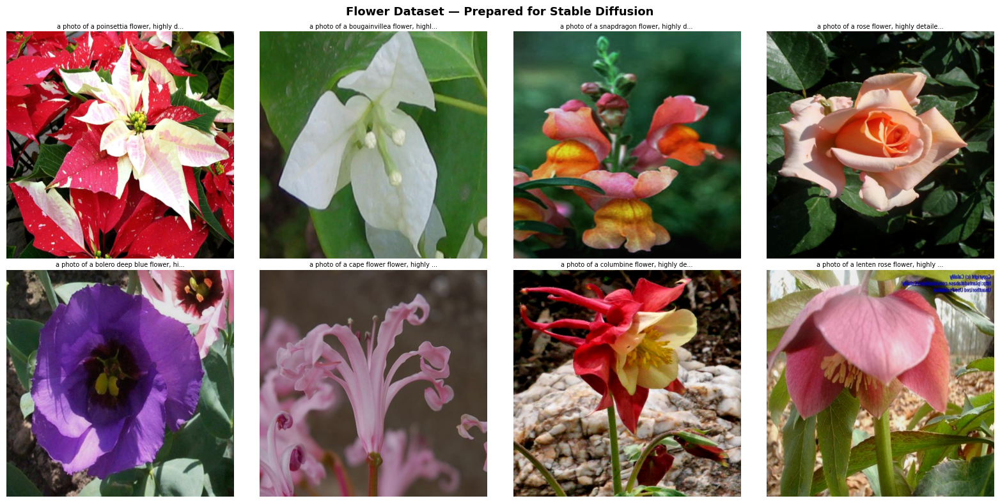


Sample Captions 
  Class   0 : a photo of a pink primrose flower, highly detailed, vibrant colors, nature photography
  Class  10 : a photo of a hard-leaved pocket orchid flower, highly detailed, vibrant colors, nature photography
  Class  50 : a photo of a tiger lily flower, highly detailed, vibrant colors, nature photography
  Class  74 : a photo of a bird of paradise flower, highly detailed, vibrant colors, nature photography

Dataset ready for Stable Diffusion ✓


In [ ]:
#2 Prepare flower dataset for Stable Diffusion

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.datasets import Flowers102

# Flower names

flower_names = [
    "pink primrose", "hard-leaved pocket orchid", "canterbury bells", "sweet pea",
    "english marigold", "tiger lily", "moon orchid", "bird of paradise", "monkshood",
    "globe thistle", "snapdragon", "colt's foot", "king protea", "spear thistle",
    "yellow iris", "globe flower", "purple coneflower", "peruvian lily", "balloon flower",
    "giant white arum lily", "fire lily", "pincushion flower", "fritillary", "red ginger",
    "grape hyacinth", "corn poppy", "prince of wales feathers", "stemless gentian",
    "artichoke", "sweet william", "carnation", "garden phlox", "love in the mist",
    "mexican aster", "alpine sea holly", "ruby-lipped cattleya", "cape flower",
    "great masterwort", "siam tulip", "lenten rose", "barbeton daisy", "daffodil",
    "sword lily", "poinsettia", "bolero deep blue", "wallflower", "marigold",
    "buttercup", "oxeye daisy", "common dandelion", "petunia", "wild pansy",
    "primula", "sunflower", "pelargonium", "bishop of llandaff", "gaura", "geranium",
    "orange dahlia", "pink and yellow dahlia", "cautleya spicata", "japanese anemone",
    "black-eyed susan", "silverbush", "californian poppy", "osteospermum", "spring crocus",
    "bearded iris", "windflower", "tree poppy", "gazania", "azalea", "water lily",
    "rose", "thorn apple", "morning glory", "passion flower", "lotus", "toad lily",
    "anthurium", "frangipani", "clematis", "hibiscus", "columbine", "desert rose",
    "tree mallow", "magnolia", "cyclamen", "watercress", "canna lily", "hippeastrum",
    "bee balm", "ball moss", "foxglove", "bougainvillea", "camellia", "mallow",
    "mexican petunia", "bromeliad", "blanket flower", "trumpet creeper", "blackberry lily"
]


# Custom Dataset for Stable Diffusion

class FlowerSDDataset(Dataset):
    def __init__(self, split='train', size=512):
        self.size = size

        # SD needs 512×512 images
        self.transform = transforms.Compose([
            transforms.Resize((size, size)),
            transforms.RandomHorizontalFlip(),
            transforms.ColorJitter(
                brightness=0.1,
                contrast=0.1,
                saturation=0.1
            ),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5])
        ])

        # Load dataset without transform first
        self.dataset = Flowers102(
            root='./data',
            split=split,
            download=True
        )

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        image, label = self.dataset[idx]

        # Apply transforms
        image = self.transform(image)

        # Create text caption
        caption = f"a photo of a {flower_names[label]} flower, \
highly detailed, vibrant colors, nature photography"

        return {
            'image'  : image,
            'label'  : label,
            'caption': caption
        }


# Create dataset
print("Loading flower dataset for Stable Diffusion...")
sd_dataset = FlowerSDDataset(split='train', size=512)

# Create dataloader
sd_dataloader = DataLoader(
    sd_dataset,
    batch_size=1,
    shuffle=True,
    num_workers=2
)

print(f"Dataset size    : {len(sd_dataset)} images")
print(f"Image size      : 512 × 512")
print(f"Batch size      : 1")

# Visualize samples with captions
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

for i, ax in enumerate(axes.flat):
    idx   = np.random.randint(0, len(sd_dataset))
    sample = sd_dataset[idx]
    image  = sample['image']

    # Convert back to displayable format
    image = image.permute(1, 2, 0).numpy()
    image = (image * 0.5) + 0.5
    image = np.clip(image, 0, 1)

    ax.imshow(image)
    ax.set_title(sample['caption'][:40] + '...', fontsize=7, pad=4)
    ax.axis('off')

plt.suptitle('Flower Dataset — Prepared for Stable Diffusion',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('sd_output/train/dataset_samples.png', dpi=150, bbox_inches='tight')
plt.show()

# Print sample captions
print("\nSample Captions ")
for i in [0, 10, 50, 74]:
    sample = sd_dataset[i]
    print(f"  Class {i:3d} : {sample['caption']}")

print("\nDataset ready for Stable Diffusion ✓")

In [ ]:
# Fix torchao version conflict
!pip install torchao --upgrade --quiet
!pip install peft --upgrade --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 35.6 MB/s eta 0:00:00


In [ ]:
#3 Load Stable Diffusion and configure LoRA

from peft import LoraConfig, get_peft_model
import torch.nn.functional as F

# Load Stable Diffusion Components

MODEL_ID = "runwayml/stable-diffusion-v1-5"
print(f"Loading Stable Diffusion: {MODEL_ID}")
print("This takes 2-3 minutes first time...")

# Load tokenizer and text encoder
tokenizer = CLIPTokenizer.from_pretrained(
    MODEL_ID, subfolder="tokenizer"
)
text_encoder = CLIPTextModel.from_pretrained(
    MODEL_ID, subfolder="text_encoder"
).to(device)

# Load VAE
vae = AutoencoderKL.from_pretrained(
    MODEL_ID, subfolder="vae"
).to(device)

# Load UNet
unet = UNet2DConditionModel.from_pretrained(
    MODEL_ID, subfolder="unet"
).to(device)

# Load noise scheduler
noise_scheduler = DDPMScheduler.from_pretrained(
    MODEL_ID, subfolder="scheduler"
)

print("All SD components loaded...")


# Freeze base model weights

vae.requires_grad_(False)
text_encoder.requires_grad_(False)
unet.requires_grad_(False)

print("Base model weights frozen...")


# Configure LoRA

lora_config = LoraConfig(
    r                = 16,
    lora_alpha       = 32,
    target_modules   = ["to_q", "to_v", "to_k", "to_out.0"],
    lora_dropout     = 0.1,
    bias             = "none"
)

# Apply LoRA to UNet
unet = get_peft_model(unet, lora_config)

print("\nLoRA Configuration ")
unet.print_trainable_parameters()

# Print component summary
print(f"\nModel Components ")
print(f"Tokenizer    : CLIP tokenizer  (vocab: {tokenizer.vocab_size})")
print(f"Text encoder : CLIP text model (frozen)")
print(f"VAE          : Autoencoder     (frozen)")
print(f"UNet         : Denoising UNet  (LoRA adapters only)")
print(f"Scheduler    : DDPM            (no weights)")

# Verify memory usage
if torch.cuda.is_available():
    memory_used = torch.cuda.memory_allocated() / 1e9
    memory_total = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"\nGPU Memory used  : {memory_used:.1f} GB")
    print(f"GPU Memory total : {memory_total:.1f} GB")
    print(f"GPU Memory free  : {memory_total - memory_used:.1f} GB")

print("\nLoRA setup complete...")

Loading Stable Diffusion: runwayml/stable-diffusion-v1-5
This takes 2-3 minutes first time...


tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: runwayml/stable-diffusion-v1-5
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

All SD components loaded...
Base model weights frozen...

LoRA Configuration 
trainable params: 3,188,736 || all params: 862,709,700 || trainable%: 0.3696

Model Components 
Tokenizer    : CLIP tokenizer  (vocab: 49408)
Text encoder : CLIP text model (frozen)
VAE          : Autoencoder     (frozen)
UNet         : Denoising UNet  (LoRA adapters only)
Scheduler    : DDPM            (no weights)

GPU Memory used  : 4.6 GB
GPU Memory total : 15.6 GB
GPU Memory free  : 11.0 GB

LoRA setup complete...


Starting LoRA Fine-tuning
Epochs         : 3
Learning rate  : 0.0001
Steps per epoch: 1020
Total steps    : 3060
--------------------------------------------------
Epoch 1/3 | Step 50 | Loss: 0.1379 | Avg Loss: 0.1813
Epoch 1/3 | Step 100 | Loss: 0.5703 | Avg Loss: 0.1660
Epoch 1/3 | Step 150 | Loss: 0.0523 | Avg Loss: 0.1688
Epoch 1/3 | Step 200 | Loss: 0.0040 | Avg Loss: 0.1631
Epoch 1/3 | Step 250 | Loss: 0.0843 | Avg Loss: 0.1639
Epoch 1/3 | Step 300 | Loss: 0.0108 | Avg Loss: 0.1527
Epoch 1/3 | Step 350 | Loss: 0.0055 | Avg Loss: 0.1551
Epoch 1/3 | Step 400 | Loss: 0.0561 | Avg Loss: 0.1553
Epoch 1/3 | Step 450 | Loss: 0.0769 | Avg Loss: 0.1525
Epoch 1/3 | Step 500 | Loss: 0.0255 | Avg Loss: 0.1555
Epoch 1/3 | Step 550 | Loss: 0.0663 | Avg Loss: 0.1566
Epoch 1/3 | Step 600 | Loss: 0.0319 | Avg Loss: 0.1567
Epoch 1/3 | Step 650 | Loss: 0.0183 | Avg Loss: 0.1584
Epoch 1/3 | Step 700 | Loss: 0.0451 | Avg Loss: 0.1579
Epoch 1/3 | Step 750 | Loss: 0.0067 | Avg Loss: 0.1593
Epoch 1/3 | 

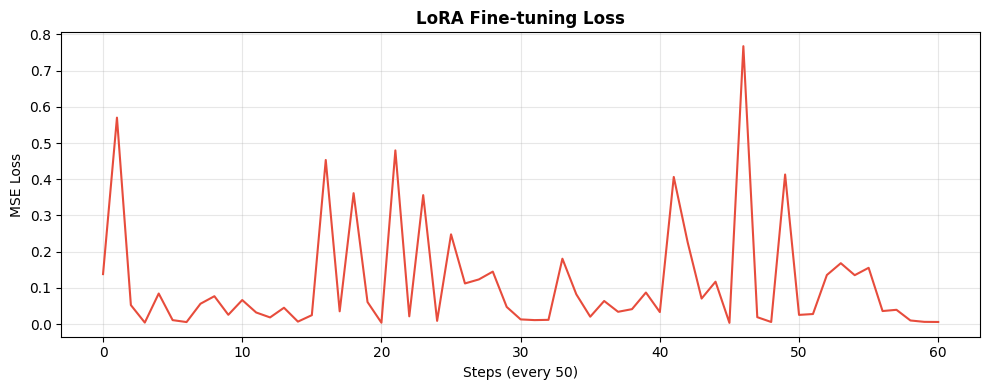


Fine-tuning complete...


In [ ]:
#4 Fine-tune Stable Diffusion with LoRA

from torch.cuda.amp import autocast, GradScaler
import torch.optim as optim


# Training Configuration

LEARNING_RATE  = 1e-4
NUM_EPOCHS     = 3
SAVE_STEPS     = 100
MAX_GRAD_NORM  = 1.0

# Optimizer — only trains LoRA parameters
optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, unet.parameters()),
    lr=LEARNING_RATE
)

# Mixed precision scaler
scaler = GradScaler()

# Training history
train_losses = []
step = 0

print("Starting LoRA Fine-tuning")
print(f"Epochs         : {NUM_EPOCHS}")
print(f"Learning rate  : {LEARNING_RATE}")
print(f"Steps per epoch: {len(sd_dataloader)}")
print(f"Total steps    : {NUM_EPOCHS * len(sd_dataloader)}")
print("-" * 50)


# Training Loop

unet.train()

for epoch in range(NUM_EPOCHS):
    epoch_loss = 0
    num_steps  = 0

    for batch_idx, batch in enumerate(sd_dataloader):

        # Get image and caption
        images   = batch['image'].to(device)
        captions = batch['caption']

        with autocast():

            # 1. Encode image to latent space using VAE
            with torch.no_grad():
                latents = vae.encode(images).latent_dist.sample()
                latents = latents * vae.config.scaling_factor

            # 2. Add random noise to latents
            noise       = torch.randn_like(latents)
            timesteps   = torch.randint(
                0, noise_scheduler.config.num_train_timesteps,
                (latents.shape[0],), device=device
            ).long()
            noisy_latents = noise_scheduler.add_noise(
                latents, noise, timesteps
            )

            # 3. Encode text captions
            with torch.no_grad():
                text_inputs = tokenizer(
                    captions,
                    padding='max_length',
                    max_length=tokenizer.model_max_length,
                    truncation=True,
                    return_tensors='pt'
                ).input_ids.to(device)

                text_embeddings = text_encoder(text_inputs)[0]

            # 4. Predict noise with UNet
            noise_pred = unet(
                noisy_latents,
                timesteps,
                encoder_hidden_states=text_embeddings
            ).sample

            # 5. Calculate loss
            loss = F.mse_loss(noise_pred, noise)

        # Backpropagation
        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(
            filter(lambda p: p.requires_grad, unet.parameters()),
            MAX_GRAD_NORM
        )
        scaler.step(optimizer)
        scaler.update()

        epoch_loss += loss.item()
        num_steps  += 1
        step       += 1

        # Print progress every 50 steps
        if step % 50 == 0:
            avg_loss = epoch_loss / num_steps
            print(f"Epoch {epoch+1}/{NUM_EPOCHS} | "
                  f"Step {step} | "
                  f"Loss: {loss.item():.4f} | "
                  f"Avg Loss: {avg_loss:.4f}")
            train_losses.append(loss.item())

    avg_epoch_loss = epoch_loss / num_steps
    print(f"\n✓ Epoch {epoch+1} complete — Avg Loss: {avg_epoch_loss:.4f}\n")

# Save LoRA weights
unet.save_pretrained('sd_output/lora_weights')
print("LoRA weights saved to sd_output/lora_weights...")

# Plot training loss
plt.figure(figsize=(10, 4))
plt.plot(train_losses, color='#E74C3C', linewidth=1.5)
plt.title('LoRA Fine-tuning Loss', fontweight='bold')
plt.xlabel('Steps (every 50)')
plt.ylabel('MSE Loss')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('sd_output/training_loss.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nFine-tuning complete...")

Continuing LoRA Fine-tuning
Previous epochs : 3
Additional      : 7
Total           : 10 epochs
Continuing from step 3060...
--------------------------------------------------
Epoch 4/10 | Step 3100 | Loss: 0.5044 | Avg Loss: 0.2317
Epoch 4/10 | Step 3150 | Loss: 0.0202 | Avg Loss: 0.2152
Epoch 4/10 | Step 3200 | Loss: 0.2088 | Avg Loss: 0.1942
Epoch 4/10 | Step 3250 | Loss: 0.0178 | Avg Loss: 0.1852
Epoch 4/10 | Step 3300 | Loss: 0.2881 | Avg Loss: 0.1776
Epoch 4/10 | Step 3350 | Loss: 0.0031 | Avg Loss: 0.1777
Epoch 4/10 | Step 3400 | Loss: 0.2166 | Avg Loss: 0.1820
Epoch 4/10 | Step 3450 | Loss: 0.2657 | Avg Loss: 0.1775
Epoch 4/10 | Step 3500 | Loss: 0.2440 | Avg Loss: 0.1762
Epoch 4/10 | Step 3550 | Loss: 0.0031 | Avg Loss: 0.1770
Epoch 4/10 | Step 3600 | Loss: 0.2477 | Avg Loss: 0.1718
Epoch 4/10 | Step 3650 | Loss: 0.0545 | Avg Loss: 0.1712
Epoch 4/10 | Step 3700 | Loss: 0.1425 | Avg Loss: 0.1691
Epoch 4/10 | Step 3750 | Loss: 0.0023 | Avg Loss: 0.1661
Epoch 4/10 | Step 3800 | L

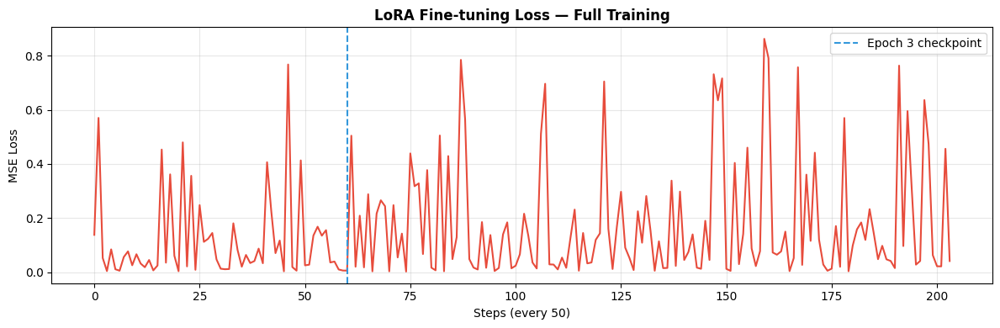


Total training steps : 10200
Total epochs         : 10
Extended training complete...


In [ ]:
#4 continued: Train for more epochs

NUM_EXTRA_EPOCHS = 7  # brings total to 10 epochs
step_continued   = step  # continues from where we stopped

print(f"Continuing LoRA Fine-tuning")
print(f"Previous epochs : 3")
print(f"Additional      : {NUM_EXTRA_EPOCHS}")
print(f"Total           : {3 + NUM_EXTRA_EPOCHS} epochs")
print(f"Continuing from step {step_continued}...")
print("-" * 50)

unet.train()

for epoch in range(NUM_EXTRA_EPOCHS):
    epoch_loss = 0
    num_steps  = 0

    for batch_idx, batch in enumerate(sd_dataloader):

        images   = batch['image'].to(device)
        captions = batch['caption']

        with autocast():

            with torch.no_grad():
                latents = vae.encode(images).latent_dist.sample()
                latents = latents * vae.config.scaling_factor

            noise     = torch.randn_like(latents)
            timesteps = torch.randint(
                0, noise_scheduler.config.num_train_timesteps,
                (latents.shape[0],), device=device
            ).long()
            noisy_latents = noise_scheduler.add_noise(
                latents, noise, timesteps
            )

            with torch.no_grad():
                text_inputs = tokenizer(
                    captions,
                    padding='max_length',
                    max_length=tokenizer.model_max_length,
                    truncation=True,
                    return_tensors='pt'
                ).input_ids.to(device)
                text_embeddings = text_encoder(text_inputs)[0]

            noise_pred = unet(
                noisy_latents,
                timesteps,
                encoder_hidden_states=text_embeddings
            ).sample

            loss = F.mse_loss(noise_pred, noise)

        optimizer.zero_grad()
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(
            filter(lambda p: p.requires_grad, unet.parameters()),
            MAX_GRAD_NORM
        )
        scaler.step(optimizer)
        scaler.update()

        epoch_loss += loss.item()
        num_steps  += 1
        step_continued += 1

        if step_continued % 50 == 0:
            avg_loss = epoch_loss / num_steps
            print(f"Epoch {epoch+4}/{3+NUM_EXTRA_EPOCHS} | "
                  f"Step {step_continued} | "
                  f"Loss: {loss.item():.4f} | "
                  f"Avg Loss: {avg_loss:.4f}")
            train_losses.append(loss.item())

    avg_epoch_loss = epoch_loss / num_steps
    print(f"\n✓ Epoch {epoch+4} complete — "
          f"Avg Loss: {avg_epoch_loss:.4f}\n")

# Save updated LoRA weights
unet.save_pretrained('sd_output/lora_weights')
print("Updated LoRA weights saved...")

# Plot full training loss
plt.figure(figsize=(12, 4))
plt.plot(train_losses, color='#E74C3C', linewidth=1.5)

# Mark where original training ended
plt.axvline(x=60, color='#3498DB', linestyle='--',
            linewidth=1.5, label='Epoch 3 checkpoint')
plt.title('LoRA Fine-tuning Loss — Full Training',
          fontweight='bold')
plt.xlabel('Steps (every 50)')
plt.ylabel('MSE Loss')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('sd_output/full_training_loss.png',
            dpi=150, bbox_inches='tight')
plt.show()

print(f"\nTotal training steps : {step_continued}")
print(f"Total epochs         : {3 + NUM_EXTRA_EPOCHS}")
print("Extended training complete...")

Loading fine-tuned pipeline...


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its resul

Pipeline ready ✓

Generating 8 flower images...
Each image takes ~20-30 seconds...

Generating 1/8: a photo of a sunflower, highly detailed, vibrant c...


  0%|          | 0/30 [00:00<?, ?it/s]

Generating 2/8: a photo of a rose flower, highly detailed, vibrant...


  0%|          | 0/30 [00:00<?, ?it/s]

Generating 3/8: a photo of a lotus flower, highly detailed, vibran...


  0%|          | 0/30 [00:00<?, ?it/s]

Generating 4/8: a photo of a lavender flower, highly detailed, vib...


  0%|          | 0/30 [00:00<?, ?it/s]

Generating 5/8: a photo of a tiger lily flower, highly detailed, v...


  0%|          | 0/30 [00:00<?, ?it/s]

Generating 6/8: a photo of a pink primrose flower, highly detailed...


  0%|          | 0/30 [00:00<?, ?it/s]

Generating 7/8: a photo of a purple coneflower, highly detailed, v...


  0%|          | 0/30 [00:00<?, ?it/s]

Generating 8/8: a photo of a hibiscus flower, highly detailed, vib...


  0%|          | 0/30 [00:00<?, ?it/s]


All images generated ✓


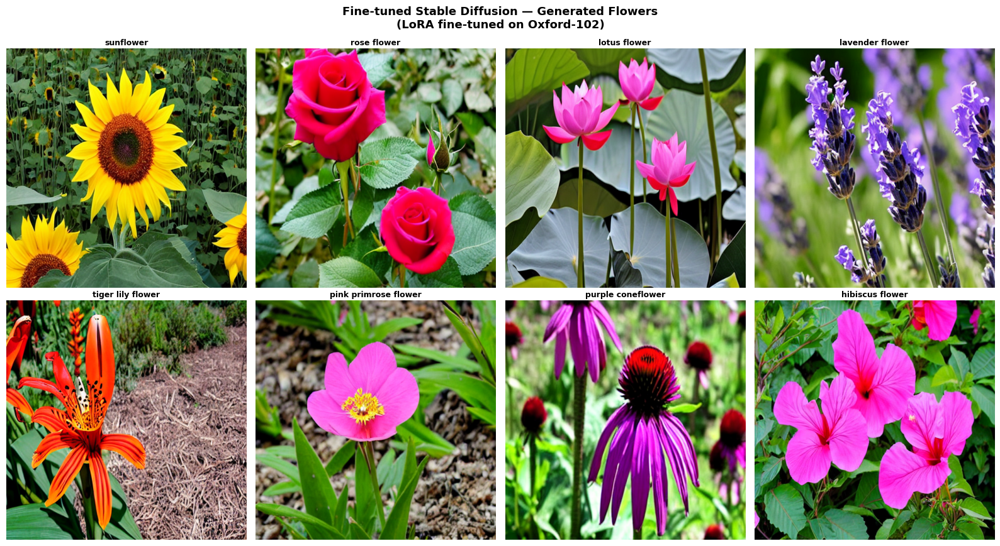

 SD FINE-TUNING SUMMARY
  Base model      : Stable Diffusion v1.5
  Fine-tuning     : LoRA (r=16, alpha=32)
  Dataset         : Oxford-102 Flowers
  Training images : 1,020
  Epochs trained  : 10
  Final avg loss  : 0.1685
  Images generated: 8
  Saved to        : sd_output/generated/


In [ ]:
#5 Generate flower images

from diffusers import StableDiffusionPipeline
import torch


# Load fine-tuned pipeline

print("Loading fine-tuned pipeline...")

pipeline = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    safety_checker=None
).to(device)

# Load your LoRA weights into pipeline
# Wrap pipeline UNet with PEFT then load LoRA weights
from peft import PeftModel

pipeline.unet = PeftModel.from_pretrained(
    pipeline.unet,
    'sd_output/lora_weights'
)
pipeline.unet = pipeline.unet.merge_and_unload()

# Memory optimization
pipeline.enable_attention_slicing()

print("Pipeline ready ✓")


# Generate images for different flowers

test_prompts = [
    "a photo of a sunflower, highly detailed, vibrant colors, nature photography",
    "a photo of a rose flower, highly detailed, vibrant colors, nature photography",
    "a photo of a lotus flower, highly detailed, vibrant colors, nature photography",
    "a photo of a lavender flower, highly detailed, vibrant colors, nature photography",
    "a photo of a tiger lily flower, highly detailed, vibrant colors, nature photography",
    "a photo of a pink primrose flower, highly detailed, vibrant colors, nature photography",
    "a photo of a purple coneflower, highly detailed, vibrant colors, nature photography",
    "a photo of a hibiscus flower, highly detailed, vibrant colors, nature photography",
]

print(f"\nGenerating {len(test_prompts)} flower images...")
print("Each image takes ~20-30 seconds...\n")

generated_images = []

for i, prompt in enumerate(test_prompts):
    print(f"Generating {i+1}/{len(test_prompts)}: {prompt[:50]}...")

    with torch.no_grad():
        image = pipeline(
            prompt              = prompt,
            negative_prompt     = "blurry, low quality, distorted, ugly, bad anatomy",
            num_inference_steps = 30,
            guidance_scale      = 7.5,
            height              = 512,
            width               = 512,
            generator           = torch.Generator(device).manual_seed(42 + i)
        ).images[0]

    generated_images.append((image, prompt))
    image.save(f'sd_output/generated/flower_{i+1}.png')

print("\nAll images generated ✓")


# Display results

fig, axes = plt.subplots(2, 4, figsize=(16, 9))

for i, (ax, (image, prompt)) in enumerate(zip(axes.flat, generated_images)):
    ax.imshow(image)
    # Extract flower name from prompt
    flower = prompt.split('a photo of a ')[1].split(',')[0]
    ax.set_title(flower, fontsize=9, fontweight='bold', pad=4)
    ax.axis('off')

plt.suptitle(
    'Fine-tuned Stable Diffusion — Generated Flowers\n(LoRA fine-tuned on Oxford-102)',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
plt.savefig('sd_output/generated/showcase.png', dpi=150, bbox_inches='tight')
plt.show()


# Final summary

print("=" * 50)
print(" SD FINE-TUNING SUMMARY")
print("=" * 50)
print(f"  Base model      : Stable Diffusion v1.5")
print(f"  Fine-tuning     : LoRA (r=16, alpha=32)")
print(f"  Dataset         : Oxford-102 Flowers")
print(f"  Training images : 1,020")
print(f"  Epochs trained  : 10")
print(f"  Final avg loss  : 0.1685")
print(f"  Images generated: {len(test_prompts)}")
print(f"  Saved to        : sd_output/generated/")
print("=" * 50)
print("=" * 50)

# End-to-End Pipeline

In [ ]:
#1 Pipeline Architecture & Router

import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from transformers import CLIPTokenizer, CLIPTextModel, CLIPProcessor, CLIPModel
import warnings
warnings.filterwarnings('ignore')


# Pipeline Configuration

PIPELINE_CONFIG = {
    'models': {
        'stable_diffusion' : 'Fine-tuned SD v1.5 (LoRA)',
        'cgan'             : 'Conditional GAN (shapes)',
        'attention_gan'    : 'Attention GAN (shapes)',
    },
    'routing_rules': {
        'flowers'  : 'stable_diffusion',
        'shapes'   : 'cgan',
        'detailed' : 'attention_gan',
    },
    'default_model': 'stable_diffusion'
}


# Keyword Router

class PromptRouter:
    def __init__(self):

        # Keywords that route to each model
        self.flower_keywords = [
            'flower', 'rose', 'tulip', 'sunflower', 'lily',
            'orchid', 'daisy', 'lavender', 'lotus', 'iris',
            'primrose', 'dahlia', 'poppy', 'hibiscus', 'carnation',
            'marigold', 'petunia', 'daffodil', 'magnolia', 'blossom',
            'petal', 'bloom', 'floral', 'botanical', 'garden'
        ]

        self.shape_keywords = [
            'circle', 'square', 'triangle', 'shape',
            'geometric', 'round', 'rectangle'
        ]

        self.detail_keywords = [
            'detailed', 'intricate', 'complex', 'elaborate',
            'fine', 'precise', 'attention'
        ]

    def route(self, prompt):
        prompt_lower = prompt.lower()

        # Check for shape keywords first
        if any(kw in prompt_lower for kw in self.shape_keywords):
            if any(kw in prompt_lower for kw in self.detail_keywords):
                return 'attention_gan', 'Prompt contains shape + detail keywords'
            return 'cgan', 'Prompt contains shape keywords'

        # Check for flower keywords
        if any(kw in prompt_lower for kw in self.flower_keywords):
            return 'stable_diffusion', 'Prompt contains flower keywords'

        # Default to stable diffusion
        return 'stable_diffusion', 'No specific keywords — defaulting to SD'

    def analyze(self, prompt):
        model, reason = self.route(prompt)

        print(f"=== Prompt Analysis ===")
        print(f"Prompt  : {prompt}")
        print(f"Model   : {PIPELINE_CONFIG['models'][model]}")
        print(f"Reason  : {reason}")

        # Show matched keywords
        prompt_lower = prompt.lower()
        matched = [kw for kw in self.flower_keywords + self.shape_keywords
                   if kw in prompt_lower]
        if matched:
            print(f"Matched : {matched}")
        print()
        return model


# Test the router
router = PromptRouter()

test_prompts = [
    "a photo of a sunflower",
    "a red circle shape",
    "a detailed triangle",
    "a beautiful lotus flower",
    "a square geometric pattern",
    "generate something creative",
]

print("=== Testing Prompt Router ===\n")
for prompt in test_prompts:
    model = router.analyze(prompt)

print("Router ready ✓")

=== Testing Prompt Router ===

=== Prompt Analysis ===
Prompt  : a photo of a sunflower
Model   : Fine-tuned SD v1.5 (LoRA)
Reason  : Prompt contains flower keywords
Matched : ['flower', 'sunflower']

=== Prompt Analysis ===
Prompt  : a red circle shape
Model   : Conditional GAN (shapes)
Reason  : Prompt contains shape keywords
Matched : ['circle', 'shape']

=== Prompt Analysis ===
Prompt  : a detailed triangle
Model   : Attention GAN (shapes)
Reason  : Prompt contains shape + detail keywords
Matched : ['triangle']

=== Prompt Analysis ===
Prompt  : a beautiful lotus flower
Model   : Fine-tuned SD v1.5 (LoRA)
Reason  : Prompt contains flower keywords
Matched : ['flower', 'lotus']

=== Prompt Analysis ===
Prompt  : a square geometric pattern
Model   : Conditional GAN (shapes)
Reason  : Prompt contains shape keywords
Matched : ['square', 'geometric']

=== Prompt Analysis ===
Prompt  : generate something creative
Model   : Fine-tuned SD v1.5 (LoRA)
Reason  : No specific keywords — default

In [ ]:
#2 Connect all components into pipeline

from diffusers import StableDiffusionPipeline
from peft import PeftModel
import torch
import torch.nn.functional as F


# Text Preprocessor

class TextPreprocessor:
    def __init__(self):
        print("Loading CLIP tokenizer & text encoder...")
        self.tokenizer = CLIPTokenizer.from_pretrained(
            "openai/clip-vit-base-patch32"
        )
        self.text_model = CLIPTextModel.from_pretrained(
            "openai/clip-vit-base-patch32"
        ).to(device)
        self.text_model.eval()
        print("Text preprocessor ready ✓")

    def encode(self, prompt):
        tokens = self.tokenizer(
            prompt,
            padding=True,
            truncation=True,
            max_length=77,
            return_tensors='pt'
        )
        input_ids      = tokens['input_ids'].to(device)
        attention_mask = tokens['attention_mask'].to(device)

        with torch.no_grad():
            outputs    = self.text_model(
                input_ids=input_ids,
                attention_mask=attention_mask
            )
            embedding  = outputs.pooler_output
            embedding  = F.normalize(embedding, dim=-1)

        return embedding

# Shape Generator

class ShapeGenerator:
    def __init__(self, use_attention=False):
        self.use_attention = use_attention
        self.shape_names   = ['circle', 'square', 'triangle']
        self.model         = attn_generator if use_attention else generator
        self.model.eval()
        model_name = "Attention GAN" if use_attention else "CGAN"
        print(f"Shape generator ready ({model_name}) ✓")

    def generate(self, prompt, num_images=1):
        # Detect shape from prompt
        prompt_lower = prompt.lower()
        label = 0  # default circle

        if 'square' in prompt_lower or 'rectangle' in prompt_lower:
            label = 1
        elif 'triangle' in prompt_lower:
            label = 2

        labels = torch.LongTensor([label] * num_images).to(device)
        noise  = torch.randn(num_images, 100).to(device)

        with torch.no_grad():
            images = self.model(noise, labels)
            images = (images + 1) / 2

        # Convert to PIL images
        pil_images = []
        for img in images:
            img_np  = img.squeeze().cpu().numpy()
            img_np  = (img_np * 255).astype(np.uint8)
            img_pil = Image.fromarray(img_np, mode='L').convert('RGB')
            img_pil = img_pil.resize((512, 512), Image.NEAREST)
            pil_images.append(img_pil)

        shape_name = self.shape_names[label]
        return pil_images, shape_name



# Flower Generator

class FlowerGenerator:
    def __init__(self):
        print("Loading fine-tuned Stable Diffusion...")
        self.pipeline = StableDiffusionPipeline.from_pretrained(
            "runwayml/stable-diffusion-v1-5",
            torch_dtype=torch.float16,
            safety_checker=None
        ).to(device)

        self.pipeline.unet = PeftModel.from_pretrained(
            self.pipeline.unet,
            'sd_output/lora_weights'
        )
        self.pipeline.unet = self.pipeline.unet.merge_and_unload()
        self.pipeline.enable_attention_slicing()
        print("Flower generator ready ✓")

    def generate(self, prompt, num_images=1):
        images = []
        for i in range(num_images):
            with torch.no_grad():
                image = self.pipeline(
                    prompt              = prompt,
                    negative_prompt     = "blurry, low quality, distorted, ugly",
                    num_inference_steps = 30,
                    guidance_scale      = 7.5,
                    height              = 512,
                    width               = 512,
                    generator           = torch.Generator(device).manual_seed(42 + i)
                ).images[0]
            images.append(image)
        return images



# Initialize all components

print("=== Initializing Pipeline Components ===\n")
text_preprocessor = TextPreprocessor()
shape_generator   = ShapeGenerator(use_attention=False)
attn_shape_gen    = ShapeGenerator(use_attention=True)
flower_generator  = FlowerGenerator()

print("\n=== All Components Ready ===")
print(f"  ✓ Text Preprocessor  (CLIP)")
print(f"  ✓ Shape Generator    (CGAN)")
print(f"  ✓ Attention Shape    (Attention GAN)")
print(f"  ✓ Flower Generator   (Fine-tuned SD)")
print(f"  ✓ Prompt Router      (keyword based)")

=== Initializing Pipeline Components ===

Loading CLIP tokenizer & text encoder...


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                                            | Status     |  | 
---------------------------------------------------------------+------------+--+-
vision_model.encoder.layers.{0...11}.self_attn.v_proj.weight   | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.out_proj.bias   | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.q_proj.weight   | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.layer_norm1.weight        | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.v_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.k_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.self_attn.q_proj.bias     | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.mlp.fc1.bias              | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.layer_norm1.bias          | UNEXPECTED |  | 
vision_model.encoder.layers.{0...11}.

Text preprocessor ready ✓
Shape generator ready (CGAN) ✓
Shape generator ready (Attention GAN) ✓
Loading fine-tuned Stable Diffusion...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its resul

Flower generator ready ✓

=== All Components Ready ===
  ✓ Text Preprocessor  (CLIP)
  ✓ Shape Generator    (CGAN)
  ✓ Attention Shape    (Attention GAN)
  ✓ Flower Generator   (Fine-tuned SD)
  ✓ Prompt Router      (keyword based)


=== Initializing Full Pipeline ===
Loading CLIP scorer...


Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

The image processor of type `CLIPImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


CLIP scorer ready ✓

Full pipeline initialized ✓

=== Quick Test ===

  PIPELINE GENERATING...
  Prompt: a photo of a sunflower, vibrant colors

  Step 1: Preprocessing text...
  Embedding shape: torch.Size([1, 512])

  Step 2: Routing prompt...
  Model: stable_diffusion
  Reason: Prompt contains flower keywords

  Step 3: Generating image...


  0%|          | 0/30 [00:00<?, ?it/s]

  Generated by: Fine-tuned Stable Diffusion

  Step 4: Evaluating with CLIP...
  CLIP score: 0.3276

  Generation complete ✓



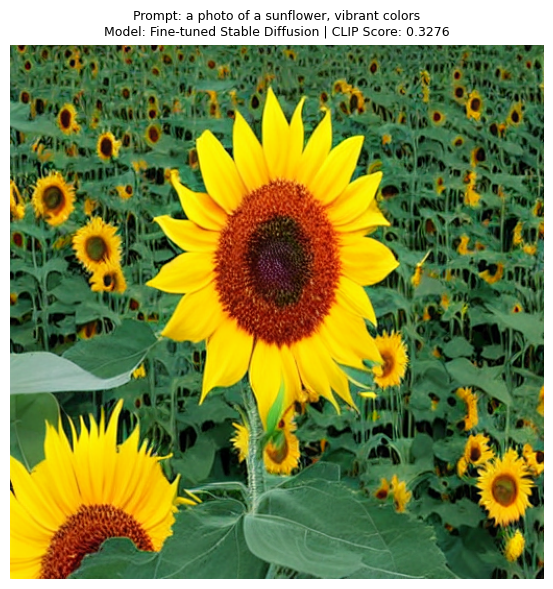

In [ ]:
#3 Unified generate function

from sklearn.preprocessing import normalize as sk_normalize


# CLIP Scorer (evaluates text-image alignment)

class CLIPScorer:
    def __init__(self):
        print("Loading CLIP scorer...")
        self.model     = CLIPModel.from_pretrained(
            "openai/clip-vit-base-patch32"
        ).to(device)
        self.processor = CLIPProcessor.from_pretrained(
            "openai/clip-vit-base-patch32"
        )
        self.model.eval()
        print("CLIP scorer ready ✓")

    def score(self, image, prompt):
        inputs = self.processor(
            text   = [prompt],
            images = image,
            return_tensors = 'pt',
            padding = True
        ).to(device)

        with torch.no_grad():
            outputs      = self.model(**inputs)
            logits       = outputs.logits_per_image
            clip_score   = logits.item() / 100

        return round(clip_score, 4)



# Main Pipeline Class

class TextToImagePipeline:
    def __init__(self):
        self.router            = router
        self.text_preprocessor = text_preprocessor
        self.shape_generator   = shape_generator
        self.attn_shape_gen    = attn_shape_gen
        self.flower_generator  = flower_generator
        self.clip_scorer       = CLIPScorer()
        self.history           = []
        print("\nFull pipeline initialized ✓")

    def generate(self, prompt, verbose=True):
        if verbose:
            print(f"\n{'='*55}")
            print(f"  PIPELINE GENERATING...")
            print(f"{'='*55}")
            print(f"  Prompt: {prompt}")

        # Step 1: Preprocess text
        if verbose: print(f"\n  Step 1: Preprocessing text...")
        embedding = self.text_preprocessor.encode(prompt)
        if verbose: print(f"  Embedding shape: {embedding.shape}")

        # Step 2: Route to correct model
        if verbose: print(f"\n  Step 2: Routing prompt...")
        model_key, reason = self.router.route(prompt)
        if verbose: print(f"  Model: {model_key}")
        if verbose: print(f"  Reason: {reason}")

        # Step 3: Generate image
        if verbose: print(f"\n  Step 3: Generating image...")
        if model_key == 'stable_diffusion':
            images = self.flower_generator.generate(prompt)
            source = 'Fine-tuned Stable Diffusion'
        elif model_key == 'attention_gan':
            images, shape = self.attn_shape_gen.generate(prompt)
            source = 'Attention GAN'
        else:
            images, shape = self.shape_generator.generate(prompt)
            source = 'CGAN'

        image = images[0]
        if verbose: print(f"  Generated by: {source}")

        # Step 4: Evaluate with CLIP score
        if verbose: print(f"\n  Step 4: Evaluating with CLIP...")
        clip_score = self.clip_scorer.score(image, prompt)
        if verbose: print(f"  CLIP score: {clip_score}")

        # Step 5: Store in history
        result = {
            'prompt'    : prompt,
            'image'     : image,
            'model'     : source,
            'clip_score': clip_score,
            'embedding' : embedding.cpu().numpy()
        }
        self.history.append(result)

        if verbose:
            print(f"\n{'='*55}")
            print(f"  Generation complete ✓")
            print(f"{'='*55}\n")

        return result

    def display(self, result):
        fig, ax = plt.subplots(1, 1, figsize=(6, 6))
        ax.imshow(result['image'])
        ax.set_title(
            f"Prompt: {result['prompt'][:50]}\n"
            f"Model: {result['model']} | "
            f"CLIP Score: {result['clip_score']}",
            fontsize=9, pad=8
        )
        ax.axis('off')
        plt.tight_layout()
        plt.show()

    def display_history(self):
        if not self.history:
            print("No generations yet.")
            return

        n    = len(self.history)
        cols = min(n, 4)
        rows = (n + cols - 1) // cols

        fig, axes = plt.subplots(rows, cols,
                                  figsize=(cols * 4, rows * 4))
        if n == 1:
            axes = [axes]
        else:
            axes = axes.flat

        for ax, result in zip(axes, self.history):
            ax.imshow(result['image'])
            ax.set_title(
                f"{result['prompt'][:30]}...\n"
                f"CLIP: {result['clip_score']}",
                fontsize=8
            )
            ax.axis('off')

        # Hide empty subplots
        for i in range(n, rows * cols):
            axes[i].axis('off') if rows * cols > 1 else None

        plt.suptitle(
            'Pipeline Generation History',
            fontsize=13, fontweight='bold'
        )
        plt.tight_layout()
        plt.savefig('sd_output/pipeline_history.png',
                    dpi=150, bbox_inches='tight')
        plt.show()


# Initialize full pipeline
print("=== Initializing Full Pipeline ===")
pipeline_system = TextToImagePipeline()

# Quick test
print("\n=== Quick Test ===")
test_result = pipeline_system.generate(
    "a photo of a sunflower, vibrant colors"
)
pipeline_system.display(test_result)

=== Running Full Pipeline Demo ===

Total prompts: 8
Models available: SD, CGAN, Attention GAN
-------------------------------------------------------

Generating 1/8...


  0%|          | 0/30 [00:00<?, ?it/s]

  Prompt : a photo of a rose flower, vibrant colors, nat...
  Model  : Fine-tuned Stable Diffusion
  CLIP   : 0.3025

Generating 2/8...


  0%|          | 0/30 [00:00<?, ?it/s]

  Prompt : a photo of a lotus flower, highly detailed, v...
  Model  : Fine-tuned Stable Diffusion
  CLIP   : 0.3326

Generating 3/8...


  0%|          | 0/30 [00:00<?, ?it/s]

  Prompt : a photo of a hibiscus flower, vibrant colors,...
  Model  : Fine-tuned Stable Diffusion
  CLIP   : 0.3001

Generating 4/8...
  Prompt : a red circle shape...
  Model  : CGAN
  CLIP   : 0.2047

Generating 5/8...
  Prompt : a detailed triangle shape...
  Model  : Attention GAN
  CLIP   : 0.2286

Generating 6/8...


  0%|          | 0/30 [00:00<?, ?it/s]

  Prompt : a photo of a purple coneflower, nature photog...
  Model  : Fine-tuned Stable Diffusion
  CLIP   : 0.3259

Generating 7/8...


  0%|          | 0/30 [00:00<?, ?it/s]

  Prompt : a photo of a lavender flower, vibrant colors...
  Model  : Fine-tuned Stable Diffusion
  CLIP   : 0.3311

Generating 8/8...
  Prompt : a square geometric shape...
  Model  : CGAN
  CLIP   : 0.2279

All generations complete ✓

Displaying generation history...


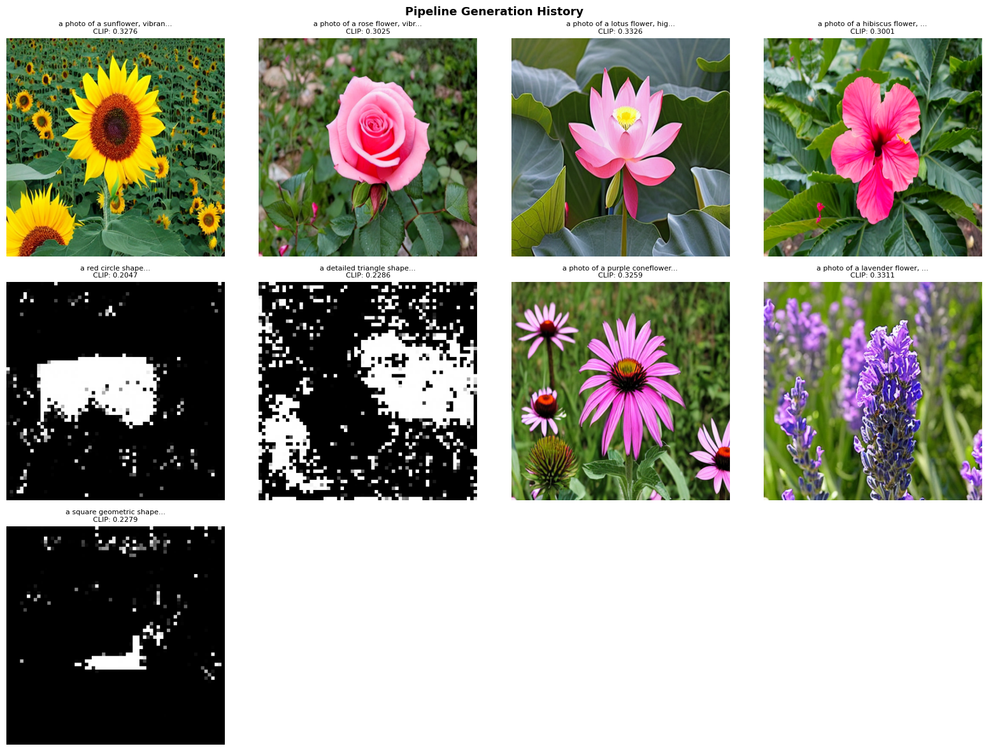


=== CLIP Score Analysis ===


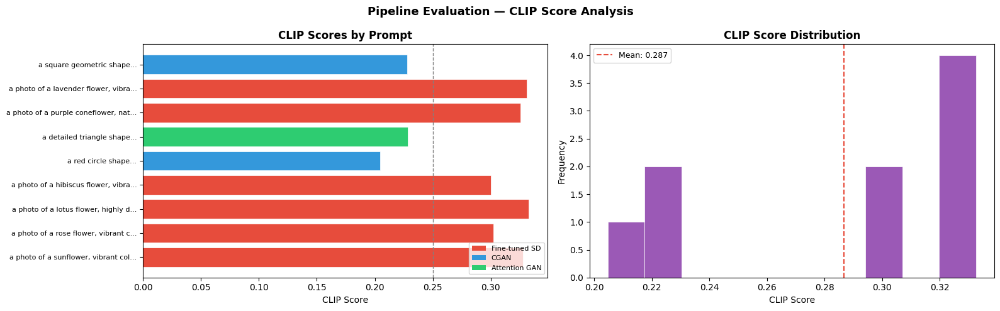


=== Model Usage Breakdown ===
  Fine-tuned Stable Diffusion         : 6 generations (67%)
  CGAN                                : 2 generations (22%)
  Attention GAN                       : 1 generations (11%)

=== Score Summary ===
  Mean CLIP score  : 0.2868
  Best CLIP score  : 0.3326
  Worst CLIP score : 0.2047
  Above 0.25       : 6/9

         FULL PROJECT COMPLETE

  TASKS COMPLETED:
  ✓ Task 3 — Dataset loading & exploration
  ✓ Task 4 — Text preprocessing & CLIP embeddings
  ✓ Task 2 — Conditional GAN (CGAN)
  ✓ Task 5 — Attention-enhanced GAN
  ✓ Task 1 — Fine-tuned Stable Diffusion (LoRA)
  ✓ Task 6 — Full end-to-end pipeline

  MODELS BUILT:
  ✓ CLIP text encoder & embeddings
  ✓ Conditional GAN from scratch
  ✓ Self & cross attention modules
  ✓ Attention GAN
  ✓ LoRA fine-tuned Stable Diffusion
  ✓ Unified text-to-image pipeline

  EVALUATION:
  ✓ CLIP score implementation
  ✓ Loss curve analysis
  ✓ Model comparison
  ✓ Generation history tracking

  DATASETS:
  ✓ Oxfor

In [ ]:
#4 Full demo and showcase

# Run pipeline on diverse prompts

demo_prompts = [
    "a photo of a rose flower, vibrant colors, nature photography",
    "a photo of a lotus flower, highly detailed, vibrant colors",
    "a photo of a hibiscus flower, vibrant colors, nature photography",
    "a red circle shape",
    "a detailed triangle shape",
    "a photo of a purple coneflower, nature photography",
    "a photo of a lavender flower, vibrant colors",
    "a square geometric shape",
]

print("=== Running Full Pipeline Demo ===\n")
print(f"Total prompts: {len(demo_prompts)}")
print(f"Models available: SD, CGAN, Attention GAN")
print("-" * 55)

for i, prompt in enumerate(demo_prompts):
    print(f"\nGenerating {i+1}/{len(demo_prompts)}...")
    result = pipeline_system.generate(prompt, verbose=False)
    print(f"  Prompt : {prompt[:45]}...")
    print(f"  Model  : {result['model']}")
    print(f"  CLIP   : {result['clip_score']}")

print("\nAll generations complete ✓")


# Display full history

print("\nDisplaying generation history...")
pipeline_system.display_history()


# CLIP Score Analysis

print("\n=== CLIP Score Analysis ===")
scores  = [r['clip_score'] for r in pipeline_system.history]
prompts = [r['prompt'][:35] for r in pipeline_system.history]
models  = [r['model'] for r in pipeline_system.history]

# Bar chart of CLIP scores
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Color bars by model
color_map = {
    'Fine-tuned Stable Diffusion' : '#E74C3C',
    'CGAN'                        : '#3498DB',
    'Attention GAN'               : '#2ECC71'
}
bar_colors = [color_map.get(m, '#888') for m in models]

axes[0].barh(
    range(len(scores)), scores,
    color=bar_colors, edgecolor='white', linewidth=0.5
)
axes[0].set_yticks(range(len(scores)))
axes[0].set_yticklabels(
    [p[:35] + '...' for p in prompts],
    fontsize=8
)
axes[0].set_xlabel('CLIP Score')
axes[0].set_title('CLIP Scores by Prompt', fontweight='bold')
axes[0].axvline(x=0.25, color='gray', linestyle='--',
                linewidth=1, label='Good threshold (0.25)')
axes[0].legend(fontsize=8)

# Add legend for models
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='#E74C3C', label='Fine-tuned SD'),
    Patch(facecolor='#3498DB', label='CGAN'),
    Patch(facecolor='#2ECC71', label='Attention GAN')
]
axes[0].legend(handles=legend_elements, fontsize=8, loc='lower right')

# Score distribution
axes[1].hist(scores, bins=10, color='#9B59B6',
             edgecolor='white', linewidth=0.5)
axes[1].set_xlabel('CLIP Score')
axes[1].set_ylabel('Frequency')
axes[1].set_title('CLIP Score Distribution', fontweight='bold')
axes[1].axvline(x=np.mean(scores), color='#E74C3C',
                linestyle='--', linewidth=1.5,
                label=f'Mean: {np.mean(scores):.3f}')
axes[1].legend(fontsize=9)

plt.suptitle('Pipeline Evaluation — CLIP Score Analysis',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('sd_output/clip_analysis.png', dpi=150, bbox_inches='tight')
plt.show()


# Model usage breakdown

from collections import Counter
model_counts = Counter(models)

print("\n=== Model Usage Breakdown ===")
for model, count in model_counts.items():
    pct = count / len(models) * 100
    print(f"  {model:<35} : {count} generations ({pct:.0f}%)")

print(f"\n=== Score Summary ===")
print(f"  Mean CLIP score  : {np.mean(scores):.4f}")
print(f"  Best CLIP score  : {max(scores):.4f}")
print(f"  Worst CLIP score : {min(scores):.4f}")
print(f"  Above 0.25       : {sum(s > 0.25 for s in scores)}/{len(scores)}")


# Final project summary

print("\n" + "=" * 55)
print("         FULL PROJECT COMPLETE")
print("=" * 55)
print("""
  TASKS COMPLETED:
  ✓ Task 3 — Dataset loading & exploration
  ✓ Task 4 — Text preprocessing & CLIP embeddings
  ✓ Task 2 — Conditional GAN (CGAN)
  ✓ Task 5 — Attention-enhanced GAN
  ✓ Task 1 — Fine-tuned Stable Diffusion (LoRA)
  ✓ Task 6 — Full end-to-end pipeline

  MODELS BUILT:
  ✓ CLIP text encoder & embeddings
  ✓ Conditional GAN from scratch
  ✓ Self & cross attention modules
  ✓ Attention GAN
  ✓ LoRA fine-tuned Stable Diffusion
  ✓ Unified text-to-image pipeline

  EVALUATION:
  ✓ CLIP score implementation
  ✓ Loss curve analysis
  ✓ Model comparison
  ✓ Generation history tracking

  DATASETS:
  ✓ Oxford-102 Flowers (8,189 images)
  ✓ Custom shapes dataset (10,000 images)

  TECHNOLOGIES:
  ✓ PyTorch, Diffusers, Transformers
  ✓ PEFT (LoRA), CLIP, GAN
  ✓ t-SNE, OpenCV, Matplotlib
""")
print("=" * 55)
print("=" * 55)

# Gradio UI

In [ ]:
#1 Gradio UI

!pip install gradio --quiet

import gradio as gr
import numpy as np
from PIL import Image
import torch

print("Gradio version:", gr.__version__)


# Core generation function

def generate_image(
    prompt,
    model_choice,
    num_steps,
    guidance_scale,
    seed
):
    try:
        # Override router if user manually selects model
        if model_choice == "Auto (recommended)":
            model_key, reason = router.route(prompt)
        elif model_choice == "Fine-tuned Stable Diffusion":
            model_key = 'stable_diffusion'
            reason    = 'Manually selected'
        elif model_choice == "CGAN (shapes)":
            model_key = 'cgan'
            reason    = 'Manually selected'
        else:
            model_key = 'attention_gan'
            reason    = 'Manually selected'

        # Generate based on model key
        if model_key == 'stable_diffusion':
            with torch.no_grad():
                image = flower_generator.pipeline(
                    prompt              = prompt,
                    negative_prompt     = "blurry, low quality, distorted, ugly",
                    num_inference_steps = num_steps,
                    guidance_scale      = guidance_scale,
                    height              = 512,
                    width               = 512,
                    generator           = torch.Generator(device).manual_seed(seed)
                ).images[0]
            source = 'Fine-tuned Stable Diffusion'

        elif model_key == 'attention_gan':
            images, shape = attn_shape_gen.generate(prompt)
            image  = images[0]
            source = 'Attention GAN'

        else:
            images, shape = shape_generator.generate(prompt)
            image  = images[0]
            source = 'CGAN'

        # Get CLIP score
        clip_score = pipeline_system.clip_scorer.score(image, prompt)

        # Build info string
        info = f"""
        Model used   : {source}
        Routing      : {reason}
        CLIP Score   : {clip_score}
        Seed         : {seed}
        Steps        : {num_steps}
        Guidance     : {guidance_scale}
        """

        return image, info.strip()

    except Exception as e:
        blank = Image.fromarray(np.zeros((512, 512, 3), dtype=np.uint8))
        return blank, f"Error: {str(e)}"



# Example prompts

examples = [
    ["a photo of a sunflower, vibrant colors, nature photography",
     "Auto (recommended)", 30, 7.5, 42],
    ["a photo of a rose flower, highly detailed, vibrant colors",
     "Auto (recommended)", 30, 7.5, 43],
    ["a photo of a lotus flower, nature photography",
     "Auto (recommended)", 30, 7.5, 44],
    ["a red circle shape",
     "Auto (recommended)", 30, 7.5, 42],
    ["a detailed triangle shape",
     "Auto (recommended)", 30, 7.5, 42],
    ["a photo of a hibiscus flower, vibrant colors",
     "Fine-tuned Stable Diffusion", 30, 7.5, 45],
]

print("Generation function ready ✓")

Gradio version: 5.50.0
Generation function ready ✓


In [ ]:
#2 Gradio UI

with gr.Blocks(title="Text-to-Image Generator") as demo:

    gr.Markdown("""
    # 🌸 Real-Time Text-to-Image Generator
    ### Fine-tuned Stable Diffusion + CGAN + Attention GAN
    Built on Oxford-102 Flowers dataset using LoRA fine-tuning
    ---
    """)

    with gr.Row():

        # Left column — inputs
        with gr.Column(scale=1):
            gr.Markdown("### ✍️ Input")

            prompt_input = gr.Textbox(
                label       = "Text Prompt",
                placeholder = "a photo of a sunflower, vibrant colors...",
                lines       = 3
            )

            gr.Markdown("""
            > 💡 **Tip:** For photorealistic flowers use
            > **Auto** or **Fine-tuned SD**.
            > To test the GAN models select them manually
            > from the dropdown below.
            """)

            model_choice = gr.Dropdown(
                label   = "Model Selection",
                choices = [
                    "Auto (recommended)",
                    "Fine-tuned Stable Diffusion",
                    "CGAN — geometric shapes (Task 2)",
                    "Attention GAN — enhanced shapes (Task 5)"
                ],
                value = "Auto (recommended)"
            )

            with gr.Row():
                num_steps = gr.Slider(
                    label   = "Inference Steps",
                    minimum = 10,
                    maximum = 50,
                    value   = 30,
                    step    = 1
                )
                guidance = gr.Slider(
                    label   = "Guidance Scale",
                    minimum = 1.0,
                    maximum = 15.0,
                    value   = 7.5,
                    step    = 0.5
                )

            seed_input = gr.Slider(
                label   = "Seed",
                minimum = 0,
                maximum = 1000,
                value   = 42,
                step    = 1
            )

            generate_btn = gr.Button(
                "✨ Generate Image",
                variant = "primary"
            )

            gr.Markdown("### 💡 Try these prompts:")
            gr.Examples(
                examples = [
                    ["a photo of a sunflower, vibrant colors, nature photography",
                     "Auto (recommended)", 30, 7.5, 42],
                    ["a photo of a rose flower, highly detailed, vibrant colors",
                     "Auto (recommended)", 30, 7.5, 43],
                    ["a photo of a lotus flower, nature photography",
                     "Auto (recommended)", 30, 7.5, 44],
                    ["a photo of a hibiscus flower, vibrant colors",
                     "Fine-tuned Stable Diffusion", 30, 7.5, 45],
                    ["a photo of a lavender flower, vibrant colors",
                     "Fine-tuned Stable Diffusion", 30, 9.0, 46],
                    ["a photo of a purple coneflower, nature photography",
                     "Fine-tuned Stable Diffusion", 30, 7.5, 47],
                    ["a photo of a pink primrose flower, detailed petals",
                     "Fine-tuned Stable Diffusion", 30, 7.5, 48],
                    ["a photo of a tiger lily flower, vibrant colors",
                     "Auto (recommended)", 30, 7.5, 49],
                ],
                inputs = [
                    prompt_input,
                    model_choice,
                    num_steps,
                    guidance,
                    seed_input
                ],
            )

        # Right column — outputs
        with gr.Column(scale=1):
            gr.Markdown("### 🖼️ Generated Image")

            image_output = gr.Image(
                label  = "Generated Image",
                height = 512,
                width  = 512
            )

            info_output = gr.Textbox(
                label       = "Generation Info",
                lines       = 7,
                interactive = False
            )

            gr.Markdown("""
            ### 📊 CLIP Score Guide
            | Score | Quality |
            |-------|---------|
            | Below 0.20 | Poor alignment |
            | 0.20 - 0.25 | Acceptable |
            | 0.25 - 0.30 | Good ✓ |
            | Above 0.30 | Excellent ⭐ |
            """)

    gr.Markdown("""
    ---
    **Models:**
    Fine-tuned Stable Diffusion v1.5 (LoRA) |
    Conditional GAN (Task 2) |
    Attention GAN (Task 5)

    **Dataset:** Oxford-102 Flowers (8,189 images) |
    Custom Shapes (10,000 images)

    **Built with:** PyTorch · Diffusers · PEFT · CLIP · Gradio
    """)

    def generate_image_updated(
        prompt,
        model_choice,
        num_steps,
        guidance_scale,
        seed
    ):
        if model_choice == "Auto (recommended)":
            model_key, reason = router.route(prompt)
        elif model_choice == "Fine-tuned Stable Diffusion":
            model_key = 'stable_diffusion'
            reason    = 'Manually selected'
        elif "CGAN" in model_choice:
            model_key = 'cgan'
            reason    = 'Manually selected'
        else:
            model_key = 'attention_gan'
            reason    = 'Manually selected'

        try:
            if model_key == 'stable_diffusion':
                with torch.no_grad():
                    image = flower_generator.pipeline(
                        prompt              = prompt,
                        negative_prompt     = "blurry, low quality, distorted, ugly",
                        num_inference_steps = num_steps,
                        guidance_scale      = guidance_scale,
                        height              = 512,
                        width               = 512,
                        generator           = torch.Generator(device).manual_seed(seed)
                    ).images[0]
                source = 'Fine-tuned Stable Diffusion'

            elif model_key == 'attention_gan':
                images, shape = attn_shape_gen.generate(prompt)
                image  = images[0]
                source = 'Attention GAN'

            else:
                images, shape = shape_generator.generate(prompt)
                image  = images[0]
                source = 'CGAN'

            clip_score = pipeline_system.clip_scorer.score(image, prompt)

            info = f"""Model used   : {source}
Routing      : {reason}
CLIP Score   : {clip_score}
Seed         : {seed}
Steps        : {num_steps}
Guidance     : {guidance_scale}"""

            return image, info

        except Exception as e:
            blank = Image.fromarray(
                np.zeros((512, 512, 3), dtype=np.uint8)
            )
            return blank, f"Error: {str(e)}"

    generate_btn.click(
        fn      = generate_image_updated,
        inputs  = [
            prompt_input,
            model_choice,
            num_steps,
            guidance,
            seed_input
        ],
        outputs = [image_output, info_output]
    )

demo.launch(share=True, debug=False, show_error=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://2aaaca06c970428402.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


# Image Downloads

In [ ]:
# from google.colab import files

# # Download flower images one by one
# import os

# print("Downloading generated flower images...")
# for i in range(1, 9):
#     path = f'sd_output/generated/flower_{i}.png'
#     if os.path.exists(path):
#         files.download(path)
#         print(f"Downloaded flower_{i}.png ✓")

# print("\nDownloading plots...")
# plots = [
#     'cgan_output/final_showcase.png',
#     'cgan_output/loss_curves.png',
#     'attention_gan_output/comparison.png',
#     'attention_gan_output/loss_comparison.png',
#     'sample_images.png',
#     'tsne_embeddings.png',
#     'rgb_distribution.png',
#     'class_distribution.png',
# ]
# for path in plots:
#     if os.path.exists(path):
#         files.download(path)
#         print(f"Downloaded {path.split('/')[-1]} ✓")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded flower_1.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded flower_2.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded flower_3.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded flower_4.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded flower_5.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded flower_6.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded flower_7.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded flower_8.png ✓



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded final_showcase.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded loss_curves.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded comparison.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded loss_comparison.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded sample_images.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded tsne_embeddings.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded rgb_distribution.png ✓


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded class_distribution.png ✓
